In [30]:
import pandas as pd
# pd.options.plotting.backend = "plotly"
# import plotly.express as px
# pd.set_option('display.max_rows',1000)
plt.rcParams['axes.linewidth'] = 1.8
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
import numpy as np
import os
import glob
from tqdm.notebook import tqdm
import math,statistics
from scipy.stats.mstats import winsorize
from scipy.spatial import distance
from analysis_module import *

In [31]:
import time
#Test for checking number of files and modification dates
for path in glob.glob(os.path.join(pred_path.ETH.value,"*", "calib_test3/outputs/*/*")):
    if not (time.localtime(os.path.getmtime(path)).tm_mday == 30) and (time.localtime(os.path.getmtime(path)).tm_mon == 3):
#     if not (len(glob.glob(os.path.join(path,"*/*"))) == 10):
        print(path, time.localtime(os.path.getmtime(path)))#, len(glob.glob(os.path.join(path,"*/*"))))

In [5339]:
# Taskwise analysis over all subjects' data
def subject_wise_Fixation(subjects, model, **kwargs):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y","acc","rms","std"])
    for subb in tqdm(subjects):
        fix_analyse = Fixation(subb, show = False)
        #pred_final = True for final calibrated samples, 
        trial_x,trial_y,rms,std  = fix_analyse.parse_trials(model, show = False, **kwargs)
        rms,std = get_fix_precision(rms,std)
        acc = get_fix_acc(fix_analyse.gt_points, trial_x,trial_y)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "acc": acc,"rms":rms ,"std":std}, ignore_index = True)
    df["mean_x"] = df.trial_x.apply( lambda x: { k:winsorize(v, limits=[0.1,0.1]).mean() for k,v in x.items() } )
    df["mean_y"] = df.trial_y.apply( lambda x: { k:winsorize(v, limits=[0.1,0.1]).mean() for k,v in x.items() } )
    return df

def subject_wise_SP(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y","onsets", "cmean","diff","cstd"])
    for subb in tqdm(subjects):
        SP_analyse = Smooth_Pursuit(subb, show=False)
        trial_x,trial_y,onsets, durations = SP_analyse.parse_trials(model, show = False)
        cmean, diff, cstd = mean_angle_preds(trial_x,trial_y, SP_analyse.angles)
        
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, 
                        "onsets": onsets, "durations": durations, 
                        "cmean":cmean ,"diff":diff, "cstd":cstd}, ignore_index = True)
    return df

def subject_wise_Zone(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y", "mean_x", "mean_y"])
    for subb in tqdm(subjects):
        zone_analyse = Zone_Classification(subb, show=False)
        trial_x,trial_y,mean_x,mean_y = zone_analyse.parse_trials(model, show = False)
#         cmean, diff, cstd = mean_angle_preds(trial_x,trial_y, SP_analyse.angles)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "mean_x": mean_x, "mean_y": mean_y}, ignore_index = True)
    return df

def subject_wise_FV(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_x","trial_y"])
    for subb in tqdm(subjects):
        FV_analyse = FreeView(subb, show=False)
        trial_x,trial_y= FV_analyse.parse_trials(model, show = False)
        df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y}, ignore_index = True)
    return df

def subject_wise_blinks(subjects, model):
    df = pd.DataFrame(columns = ["subb","trial_latencies", "num_of_blinks", "blink_durations", "avg_latency", "avg_blinks_per_trial", "avg_blink_duration"])
    for subb in tqdm(subjects):
        blink_analyse = Blink_Detect(subb, show=False)
        trial_latencies, num_of_blinks, blink_durations = blink_analyse.parse_trials(model, show = False)
        try:        
            t = np.concatenate(list(trial_latencies.values()))
            avg_latency = winsorize(t[~np.isnan(t)], limits=[0.1,0.1]).mean()

            avg_blinks_per_trial = winsorize([ i for i in list(num_of_blinks.values()) if type(i) == int], limits=[0.1,0.1]).mean()
            avg_blink_duration = winsorize(np.concatenate(list(blink_durations.values())), limits=[0.1,0.1]).mean()
            df = df.append({"subb": subb, "trial_latencies": trial_latencies, "num_of_blinks":num_of_blinks ,"blink_durations": blink_durations , 
                            "avg_latency": avg_latency, "avg_blinks_per_trial": avg_blinks_per_trial, "avg_blink_duration": avg_blink_duration}, ignore_index = True)
        except:
            print(f"Subject {subb} error: {list(trial_latencies.values())} elements")
    return df

# Fixation

In [4262]:
import analysis_fixation
from importlib import reload
reload(analysis_fixation)

<module 'analysis_fixation' from '/mnt/beegfs/users/shreshth.saxena/analysis_fixation.py'>

In [4263]:
from analysis_fixation import *
help(Fixation.parse_trials)

Help on function parse_trials in module analysis_fixation:

parse_trials(self, model, col_x, col_y, pred_final=False, pred_allcalib=False, calib_test=None, model_outputs=False, model_outputs_FT=False, eth_kalman=False, show=True, df_path=None)
    pick appropriate column names for each mode using col_x, col_y
    choose a mode from 
    
    model_outputs: use uncalibrated predictions
    
    pred_final: use Beg+Mid+End calibrated predictions (only E calib)
    
    pred_allcalib: use Beg+Mid+End with E+SP calib predictions (best resulting strategy ETRA shortpaper)
    
    eth_kalman: use kalman filtered predictions from ETH !!make sure that model==pred_path.ETH!! 
    
    model_outputs_FT: use fine tuned predictions !!make sure that model==pred_path.FAZE!!
    
    calib_test: use for calibration tests 1,2,3



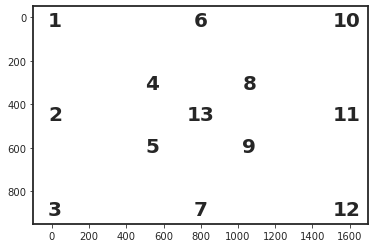

In [5078]:
#Point sequence
# plt.figure(figsize = (16,9))
pts = fix_analyse.gt_points
plt.xlim(-100,1700)
plt.ylim(-50,950)
# plt.xticks([0,400,800,1200,1600])
# plt.yticks([0,450,900], rotation= 90, va='center')
# plt.yticklabels([0,450,900],rotation=90, va="center")
for i,pt in enumerate(pts):
    plt.text(pt[0],pt[1],str(i+1), va = 'center', ha = 'center', size=20, weight=1000)
plt.gca().invert_yaxis()
# plt.grid(visible=False)
# plt.tick_params(axis='both', which='major', labelsize=20, width = 10)
# plt.savefig("fixation_screen.png", transparent=True, dpi = 300)

Recording length (ffmpeg):  54.000000
RecStop - RecStart :  54052.0
Total Frame Count :  1645
used Frames Count :  994
FPS :  30.433656478946197
key press times :  [5276, 16230, 19928, 23704, 27120, 30478, 33638, 36692, 39618, 42559, 45496, 48533, 51548]
position update times :  [7792, 18741, 22442, 26208, 29625, 32993, 36143, 39193, 42126, 45077, 48011, 51044, 54064]
diff :  [2516, 2511, 2514, 2504, 2505, 2515, 2505, 2501, 2508, 2518, 2515, 2511, 2516]


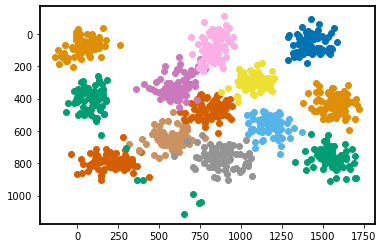

--------------------------------------------------
Recording length (ffmpeg):  45.406000
RecStop - RecStart :  45477.0
Total Frame Count :  1383
used Frames Count :  993
FPS :  30.410976977373178
key press times :  [625, 3672, 6680, 9925, 12892, 15826, 18728, 21688, 24782, 27676, 36840, 39910, 42972]
position update times :  [3142, 6174, 9191, 12441, 15408, 18343, 21242, 24192, 27293, 30193, 39343, 42427, 45483]
diff :  [2517, 2502, 2511, 2516, 2516, 2517, 2514, 2504, 2511, 2517, 2503, 2517, 2511]


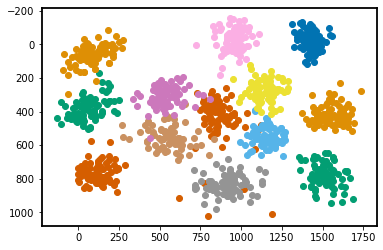

--------------------------------------------------
Recording length (ffmpeg):  38.976000
RecStop - RecStart :  39004.0
Total Frame Count :  1187
used Frames Count :  994
FPS :  30.43277612552559
key press times :  [456, 3469, 6517, 9571, 12529, 15535, 18671, 21621, 24595, 27547, 30529, 33511, 36501]
position update times :  [2959, 5975, 9027, 12077, 15044, 18043, 21176, 24127, 27111, 30061, 33044, 36028, 39014]
diff :  [2503, 2506, 2510, 2506, 2515, 2508, 2505, 2506, 2516, 2514, 2515, 2517, 2513]


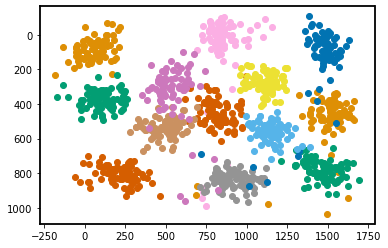

--------------------------------------------------
Recording length (ffmpeg):  39.134000
RecStop - RecStart :  39152.0
Total Frame Count :  1192
used Frames Count :  992
FPS :  30.445443400081736
key press times :  [621, 3595, 6625, 9698, 12687, 15613, 18539, 21489, 24799, 27805, 30747, 33691, 36649]
position update times :  [3132, 6098, 9131, 12216, 15198, 18115, 21049, 23999, 27300, 30317, 33250, 36200, 39154]
diff :  [2511, 2503, 2506, 2518, 2511, 2502, 2510, 2510, 2501, 2512, 2503, 2509, 2505]


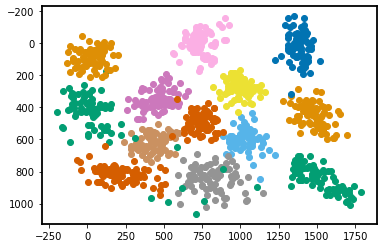

--------------------------------------------------
Recording length (ffmpeg):  39.215000
RecStop - RecStart :  39276.0
Total Frame Count :  1195
used Frames Count :  994
FPS :  30.425705265301964
key press times :  [785, 3814, 6756, 9700, 12634, 15560, 18558, 21546, 24538, 27504, 30454, 33414, 36772]
position update times :  [3301, 6318, 9268, 12201, 15151, 18068, 21069, 24052, 27052, 30019, 32968, 35920, 39287]
diff :  [2516, 2504, 2512, 2501, 2517, 2508, 2511, 2506, 2514, 2515, 2514, 2506, 2515]


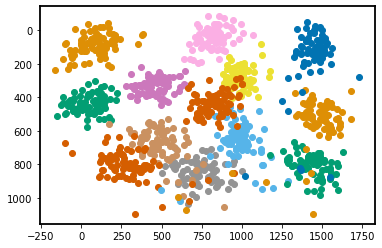

--------------------------------------------------
Recording length (ffmpeg):  39.681000
RecStop - RecStart :  39723.0
Total Frame Count :  1209
used Frames Count :  994
FPS :  30.435767691261987
key press times :  [672, 3672, 6958, 9983, 12957, 16059, 19035, 22112, 25062, 28005, 30973, 33994, 37219]
position update times :  [3175, 6176, 9461, 12494, 15460, 18577, 21544, 24627, 27579, 30512, 33478, 36512, 39734]
diff :  [2503, 2504, 2503, 2511, 2503, 2518, 2509, 2515, 2517, 2507, 2505, 2518, 2515]


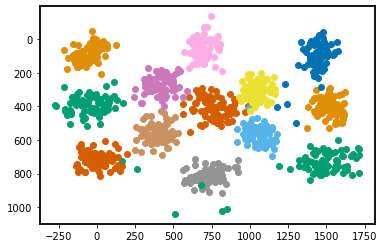

--------------------------------------------------
Recording length (ffmpeg):  38.992000
RecStop - RecStart :  39042.0
Total Frame Count :  1188
used Frames Count :  994
FPS :  30.428769017980635
key press times :  [507, 3458, 6415, 9373, 12454, 15451, 18402, 21442, 24447, 27494, 30663, 33580, 36538]
position update times :  [3021, 5970, 8921, 11888, 14972, 17956, 20905, 23955, 26955, 30005, 33173, 36089, 39044]
diff :  [2514, 2512, 2506, 2515, 2518, 2505, 2503, 2513, 2508, 2511, 2510, 2509, 2506]


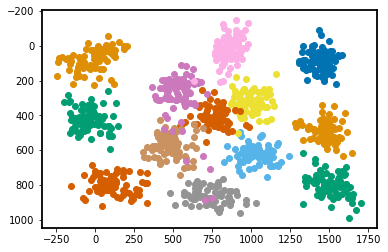

--------------------------------------------------
Recording length (ffmpeg):  38.641000
RecStop - RecStart :  38691.0
Total Frame Count :  1177
used Frames Count :  992
FPS :  30.42051123000181
key press times :  [685, 3611, 6569, 9503, 12431, 15437, 18315, 21257, 24265, 27263, 30285, 33253, 36187]
position update times :  [3192, 6127, 9076, 12009, 14943, 17944, 20827, 23761, 26777, 29777, 32795, 35761, 38701]
diff :  [2507, 2516, 2507, 2506, 2512, 2507, 2512, 2504, 2512, 2514, 2510, 2508, 2514]


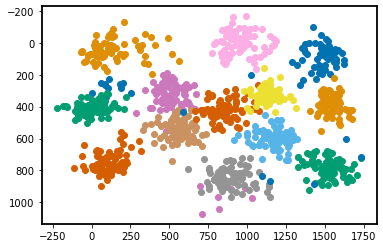

--------------------------------------------------
Recording length (ffmpeg):  38.608000
RecStop - RecStart :  38648.0
Total Frame Count :  1176
used Frames Count :  993
FPS :  30.42848271579383
key press times :  [530, 3672, 6613, 9662, 12629, 15522, 18463, 21390, 24381, 27348, 30265, 33208, 36144]
position update times :  [3046, 6178, 9129, 12179, 15147, 18028, 20981, 23896, 26896, 29864, 32779, 35714, 38649]
diff :  [2516, 2506, 2516, 2517, 2518, 2506, 2518, 2506, 2515, 2516, 2514, 2506, 2505]


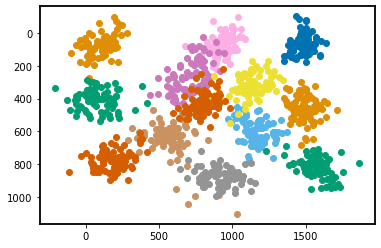

--------------------------------------------------
Recording length (ffmpeg):  38.528000
RecStop - RecStart :  38551.0
Total Frame Count :  1174
used Frames Count :  993
FPS :  30.453165936032786
key press times :  [522, 3489, 6432, 9398, 12364, 15316, 18314, 21272, 24205, 27197, 30180, 33073, 36048]
position update times :  [3031, 5998, 8948, 11899, 14866, 17834, 20817, 23783, 26717, 29701, 32684, 35585, 38553]
diff :  [2509, 2509, 2516, 2501, 2502, 2518, 2503, 2511, 2512, 2504, 2504, 2512, 2505]


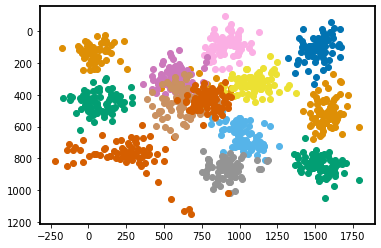

--------------------------------------------------


In [4177]:
#test
fix_analyse = Fixation("s80", show = False)
trial_x,trial_y,rms,std  = fix_analyse.parse_trials(pred_path.MPII, col_x='pred_x', col_y='pred_y', pred_allcalib=True, show = True)

In [4190]:
#Get Accuracy for single subject
print("acc for outer sq:  ",get_fix_acc(fix_analyse.gt_points, trial_x, trial_y, pt_index = [1,3,10,12]))
print("acc for diag sq:  ",get_fix_acc(fix_analyse.gt_points, trial_x, trial_y, pt_index = [2,6,7,11]))
print("acc for innter sq: ",get_fix_acc(fix_analyse.gt_points, trial_x, trial_y, pt_index = [4,5,8,9]))
print("overall acc:       ",get_fix_acc(fix_analyse.gt_points, trial_x, trial_y))

acc for outer sq:   140.37116635101484
acc for diag sq:   86.37086823544186
acc for innter sq:  75.03254534495899
overall acc:        95.42592826059743


In [4264]:
#Get Precision for single subject but this is probably not affected by position of point
print("acc for outer sq:  ",get_fix_precision(rms, std, pt_index = [1,3,10,12]))
print("acc for diag sq:  ",get_fix_precision(rms, std, pt_index = [2,6,7,11]))
print("acc for innter sq: ",get_fix_precision(rms, std, pt_index = [4,5,8,9]))
print("overall acc:       ",get_fix_precision(rms, std))

acc for outer sq:   (118.43574495912455, 132.35471720003252)
acc for diag sq:   (115.27588852924491, 123.3007147580507)
acc for innter sq:  (115.2339493250307, 111.86845409931777)
overall acc:        (115.52040160990211, 116.29973446211633)


In [51]:
# paths = glob.glob(os.path.join(pred_path.MPII.value,'s*/pred_allcalib')) ##for specific model/calibration strategy
paths = glob.glob("Subjects/s*")
subjects = [path.split('/')[1] for path in paths]

In [2217]:
##Change model to generate csv  , Kalman and BGR predictions also calculated for ETHXGaze
# fix_df_mpii = subject_wise_Fixation(subjects, pred_path.MPII, col_x = 'pred_x', col_y = 'pred_y', pred_allcalib = True) 
# fix_df_eth = subject_wise_Fixation(subjects, pred_path.ETH, col_x = 'pred_x', col_y = 'pred_y', pred_allcalib = True) 
# fix_df_faze = subject_wise_Fixation(subjects, pred_path.FAZE, col_x = 'pred_x', col_y = 'pred_y', pred_allcalib = True) 

#Load generated csvs
fix_df_mpii = pd.read_csv("csv_backup/fix_df_mpii.csv")
fix_df_eth = pd.read_csv("csv_backup/fix_df_eth.csv")
fix_df_faze = pd.read_csv("csv_backup/fix_df_faze.csv")

 58%|█████▊    | 38/65 [06:00<03:19,  7.38s/it]

no median for empty data
s64 adding nan to pt 13 trial 12


 58%|█████▊    | 38/65 [05:10<02:28,  5.51s/it]

no median for empty data
s64 adding nan to pt 13 trial 12


100%|██████████| 65/65 [09:02<00:00,  8.34s/it]


In [2221]:
fix_df = {pred_path.MPII:fix_df_mpii, pred_path.ETH:fix_df_eth, pred_path.FAZE: fix_df_faze}
model = pred_path.FAZE

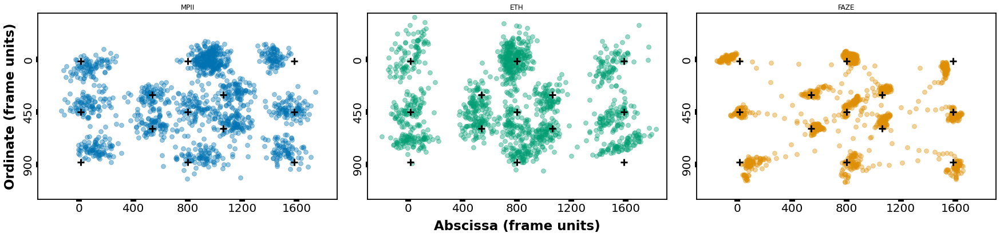

In [4169]:
#Single trial data 
fig,axs = plt.subplots(1,3, figsize= (30,6))
palette = sns.color_palette("colorblind", 3)
for i,model in enumerate(fix_df.keys()):
    df = pd.read_csv(os.path.join(model.value, f"s80/pred_allcalib/Block_13/Fixation4.csv")) #Set path to trial data

    axs[i].scatter(df.pred_x, df.pred_y, color=palette[-i], s = 60, alpha = 0.4)
    axs[i].scatter([i[0] for i in fix_analyse.gt_points], [i[1] for i in fix_analyse.gt_points], marker="+", s=140, linewidths=3, color="k")
    
    axs[i].title.set_text(list(fix_df.keys())[i].name)
    axs[i].set_xlim(-300,1900)
    axs[i].set_ylim(-400,1200)
    axs[i].set_xticks([0,400,800,1200,1600])
    axs[i].set_yticks([0,450,900])
    axs[i].set_yticklabels([0,450,900],rotation=90, va="center")
    axs[i].tick_params(axis='both', which='major', labelsize=20, width = 10)
    axs[i].invert_yaxis()
    if i==1:
        axs[i].set_xlabel("Abscissa (frame units)", fontsize=23, fontweight = 550, labelpad=10)
    if i==0:
        axs[i].set_ylabel("Ordinate (frame units)", fontsize=23, fontweight = 550, labelpad=10)
plt.subplots_adjust(wspace=0.1)
plt.savefig("full_paper_plots/fix_single_trials.png", transparent = True, dpi = 300)

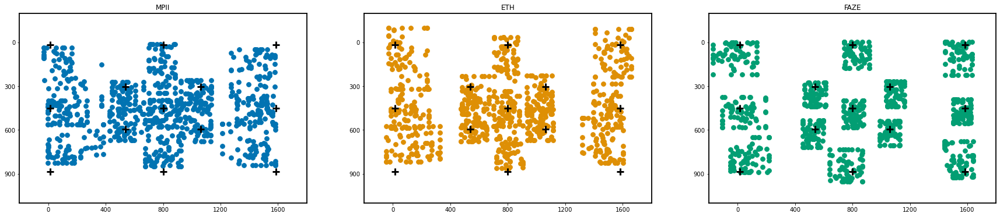

In [4021]:
#Winsorized mean fix point for all subjects
fig,axs = plt.subplots(1,3, figsize= (30,6))
palette = sns.color_palette("colorblind", 3)
for i,df in enumerate(fix_df.values()):
    fix_plot(fix_analyse.gt_points, df, axs[i], kind="all_subjects", xmax = 1800, xmin = -200, ymax=1100, ymin=-200, color = palette[i])
    axs[i].invert_yaxis()
    axs[i].title.set_text(list(fix_df.keys())[i].name)

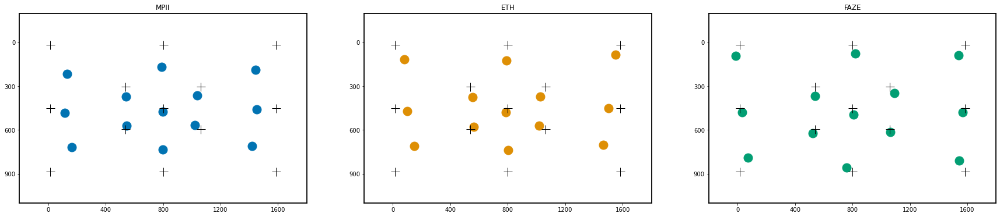

In [4029]:
fig,axs = plt.subplots(1,3, figsize= (30,6))
palette = sns.color_palette("colorblind", 3)
for i,df in enumerate(fix_df.values()):
    fix_plot(fix_analyse.gt_points, df, axs[i],xmax = 1800, xmin = -200, ymax=1100, ymin=-200, color=palette[i])
    axs[i].invert_yaxis()
    axs[i].title.set_text(list(fix_df.keys())[i].name)

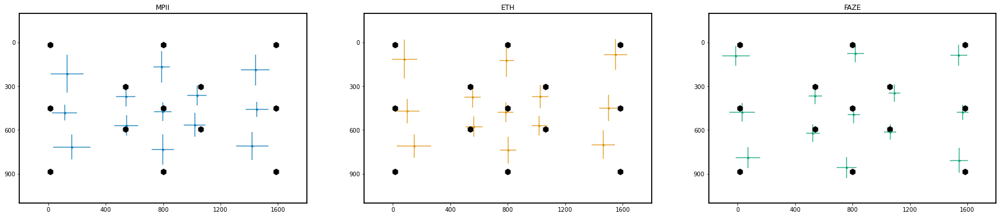

In [4030]:
fig,axs = plt.subplots(1,3, figsize= (30,6))
palette = sns.color_palette("colorblind", 3)
for i,df in enumerate(fix_df.values()):
    fix_plot(fix_analyse.gt_points, df, axs[i], kind="err", xmax = 1800, xmin = -200, ymax=1100, ymin=-200, color = palette[i])
    axs[i].invert_yaxis()
    axs[i].title.set_text(list(fix_df.keys())[i].name)

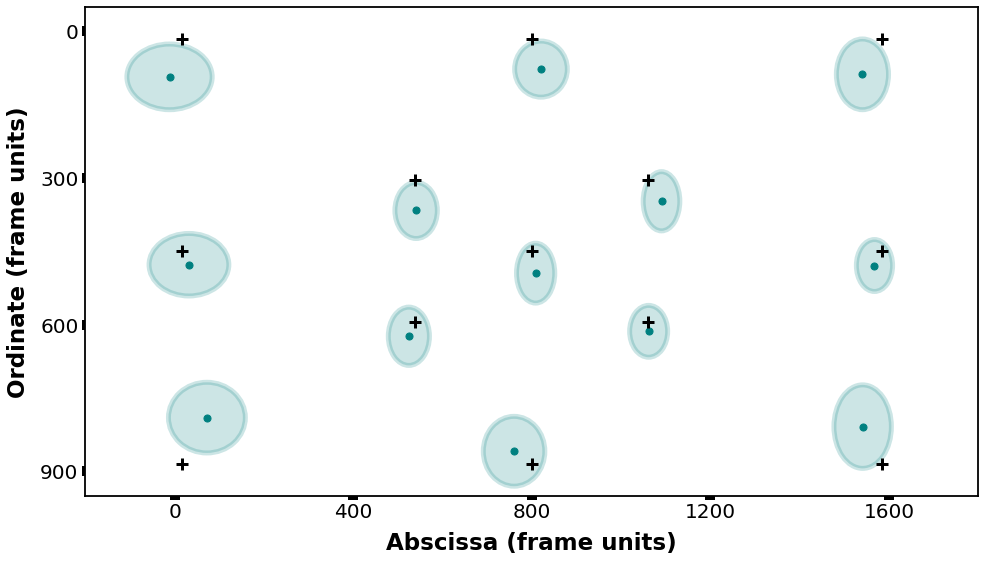

In [2595]:
fig, axs = plt.subplots(1,1,figsize=(16, 9))
df=fix_df_faze
fix_plot(fix_analyse.gt_points, df,ax=axs, kind = 'ellipse', xmin=-200, xmax=1800, ymin=-50, ymax=950)
axs.invert_yaxis()
axs.set_xlabel("Abscissa (frame units)", fontsize=23, fontweight = 550, labelpad=10)
axs.set_ylabel("Ordinate (frame units)", fontsize=23, fontweight = 550, labelpad=10)
axs.tick_params(axis='both', which='major', labelsize=20, width = 10)
# axs.title.set_text(list(fix_df.keys())[i].name)
# ax.set_yticklabels(fontsize=14)
# ax.set_xlim(-200,1800)
# ax.set_ylim(-50,950)
# plt.title("A", loc='left', position = (-0.07,0), fontsize=33, fontweight=550, va = 'top')
plt.savefig("full_paper_plots/faze_final.png", transparent=True, dpi=300)

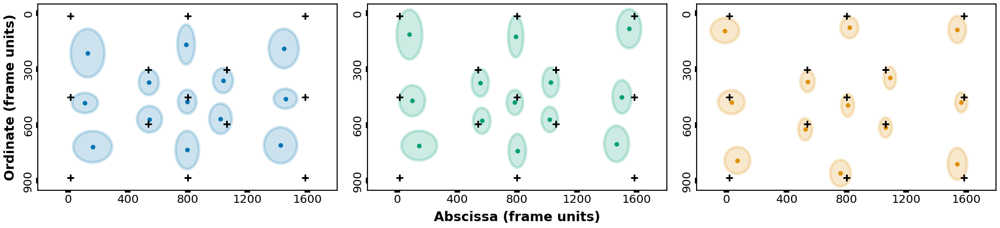

In [4099]:
#Final plot overall subjects acc and precision
fig, axs = plt.subplots(1,3,figsize=(30, 6))
palette = sns.color_palette("colorblind", 3)
for i,df in enumerate(fix_df.values()):
    fix_plot(fix_analyse.gt_points, df,ax=axs[i], kind = 'ellipse', xmin=-200, xmax=1800, ymin=-50, ymax=950, color=palette[-i])
    axs[i].invert_yaxis()
    if i==1:
        axs[i].set_xlabel("Abscissa (frame units)", fontsize=23, fontweight = 550, labelpad=10)
    if i==0:
        axs[i].set_ylabel("Ordinate (frame units)", fontsize=23, fontweight = 550, labelpad=10)
    axs[i].tick_params(axis='both', which='major', labelsize=20, width = 10)
    axs[i].set_yticklabels([0,300,600,900],rotation=90, va="center")
#     axs[i].tick_params(axis='y', labelrotation = 90, va='center')
#     axs[i].title.set_text(list(fix_df.keys())[i].name)
    # ax.set_yticklabels(fontsize=14)
    # ax.set_xlim(-200,1800)
    # ax.set_ylim(-50,950)
    # plt.title("A", loc='left', position = (-0.07,0), fontsize=33, fontweight=550, va = 'top')
plt.subplots_adjust(wspace=0.1)
plt.savefig("full_paper_plots/fix_paper.png", transparent=True, dpi=300)

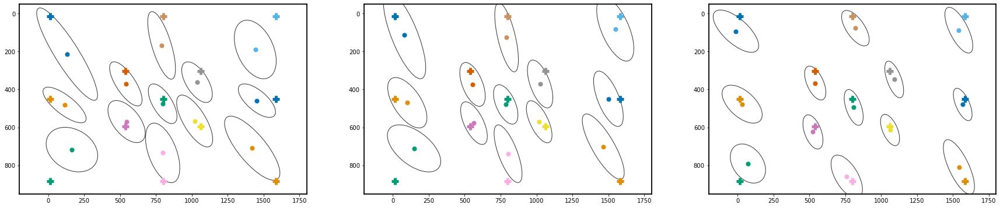

In [155]:
#Confidence ellipse
fig, axs = plt.subplots(1,3,figsize=(30, 6))
for i,df in enumerate(fix_df.values()):
    fix_plot(fix_analyse.gt_points, df, axs[i], figsize=(18,10), kind = 'cov_ellipse', xmin=-200, xmax=1800, ymin=-50, ymax=950)
    axs[i].invert_yaxis()
    # ax.set_xlabel("abscissa (in frame units)", fontsize=15)
    # ax.set_ylabel("ordinate (in frame units)", fontsize=15)
    # ax.tick_params(axis='both', which='major', labelsize=12)
# # ax.set_yticklabels(fontsize=14)
# plt.savefig("fixation_41.png")

[]

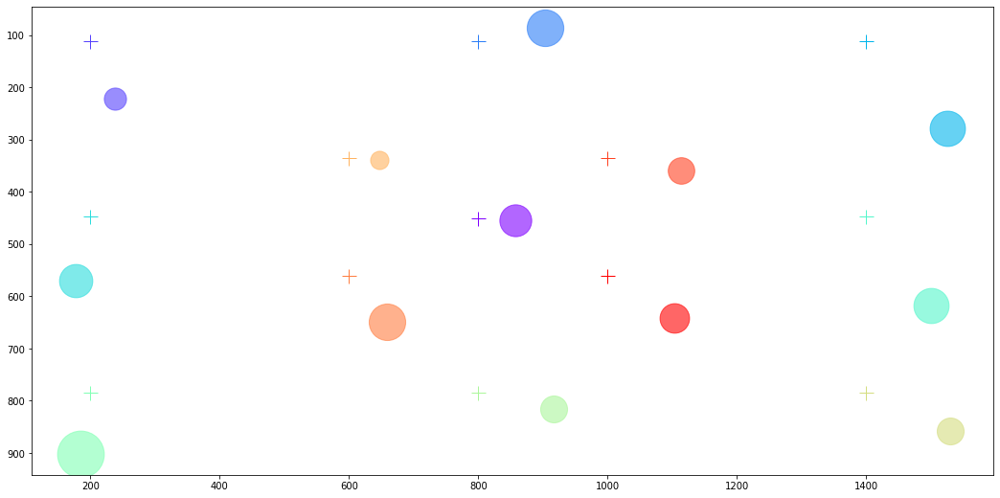

In [ ]:
#Another idea
# pallete = iter(sns.color_palette('colorblind',13))
# plt.figure(figsize=(18,9))
# for i in range(13):
#     gt = fix_analyse.gt_points[i]
#     c = next(pallete)
#     xs = winsorize(df['mean_x'].apply( lambda x: x[key+1] ), limits=[0.1,0.1]) 
#     ys = winsorize(df['mean_y'].apply( lambda y: y[key+1] ), limits=[0.1,0.1])
#     dist = [get_dist((x,y),(gt[0],gt[1])) for x,y in zip(xs,ys)]
#     size = statistics.stdev([get_dist((x,y),(X,Y)) for x,y in zip(trial_x[i],trial_y[i])])
#     plt.plot(X,Y,marker = "o", markersize = size, color = c, alpha = 0.6)
#     plt.plot(pt[0],pt[1],marker="+", markersize = 15, color = c)

# plt.gca().invert_yaxis()
# plt.plot()

In [150]:
#ETH model outputs raw uncalibrated 224*224
model="ETH"
print(f" ACC: {winsorize(fix_df_eth['acc'], limits=[0.1,0.1]).mean()/54.05}")
print(f" RMS: {winsorize(fix_df_eth['rms'], limits=[0.1,0.1]).mean()/54.05}")
print(f" STD: {winsorize(fix_df_eth['std'], limits=[0.1,0.1]).mean()/54.05}")

 ACC: 3.4028824599928775
 RMS: 1.8016140577373165
 STD: 2.3887154011666083


In [276]:
#Metrics KALMAN
model="ETH"
print(f" ACC: {winsorize(fix_df_eth_kalman['acc'], limits=[0.1,0.1]).mean()/54.05}")
print(f" RMS: {winsorize(fix_df_eth_kalman['rms'], limits=[0.1,0.1]).mean()/54.05}")
print(f" STD: {winsorize(fix_df_eth_kalman['std'], limits=[0.1,0.1]).mean()/54.05}")

 ACC: 3.0809773528273237
 RMS: 0.5462969095964321
 STD: 1.8834646689750203


In [4273]:
#Metrics
model=pred_path.FAZE
print(f" ACC: {winsorize(fix_df[model]['acc'], limits=[0.1,0.1]).mean()/54.05}")
print(f" RMS: {winsorize(fix_df[model]['rms'], limits=[0.1,0.1]).mean()/54.05}")
print(f" STD: {winsorize(fix_df[model]['std'], limits=[0.1,0.1]).mean()/54.05}")

 ACC: 2.439873928416276
 RMS: 0.471623544157286
 STD: 1.6262735480051023


In [4274]:
outer, diag, inner = [], [], []
for i,row in fix_df[model].iterrows():
    outer.append(get_fix_acc(fix_analyse.gt_points, row.trial_x, row.trial_y, pt_index = [1,3,10,12]))
    diag.append(get_fix_acc(fix_analyse.gt_points, row.trial_x, row.trial_y, pt_index = [2,6,7,11]))
    inner.append(get_fix_acc(fix_analyse.gt_points, row.trial_x, row.trial_y, pt_index = [4,5,8,9]))
print(f" ACC (outer): {winsorize(outer, limits=[0.1,0.1]).mean()/54.05}")
print(f" ACC (diag): {winsorize(diag, limits=[0.1,0.1]).mean()/54.05}")
print(f" ACC (inner): {winsorize(inner, limits=[0.1,0.1]).mean()/54.05}")

 ACC (outer): 3.0172520101261893
 ACC (diag): 2.39240116170978
 ACC (inner): 2.1203953270026936


In [4291]:
model = pred_path.FAZE
fix_df[model]["acc_outer"] = np.nan
fix_df[model]["acc_inner"] = np.nan
fix_df[model]["acc_diag"] = np.nan

for i,row in fix_df[model].iterrows():
    fix_df[model].loc[i,"acc_outer"] = (get_fix_acc(fix_analyse.gt_points, row.trial_x, row.trial_y, pt_index = [1,3,10,12]))
    fix_df[model].loc[i, "acc_diag"] = (get_fix_acc(fix_analyse.gt_points, row.trial_x, row.trial_y, pt_index = [2,6,7,11]))
    fix_df[model].loc[i, "acc_inner"] = (get_fix_acc(fix_analyse.gt_points, row.trial_x, row.trial_y, pt_index = [4,5,8,9]))


In [4462]:
def winsorize_df(df, lim= [0.1,0.1]):
    return df.apply(lambda x:winsorize(x, limits = lim), axis=0)

#Winsorized data
temp = pd.concat([winsorize_df(fix_df_mpii[["acc", "acc_outer", "acc_diag", "acc_inner"]])/54.05, 
                  winsorize_df(fix_df_eth[["acc", "acc_outer", "acc_diag", "acc_inner"]])/54.05, 
                  winsorize_df(fix_df_faze[["acc", "acc_outer", "acc_diag", "acc_inner"]])/54.05 ], keys = ["MPIIGaze", "ETHGaze", "FAZE"], names=["model"]).reset_index()
# #Non winsorized data
# temp = pd.concat([fix_df_mpii[["acc", "acc_outer", "acc_diag", "acc_inner"]]/54.05, 
#                   fix_df_eth[["acc", "acc_outer", "acc_diag", "acc_inner"]]/54.05, 
#                   fix_df_faze[["acc", "acc_outer", "acc_diag", "acc_inner"]]/54.05 ], keys = ["MPIIGaze", "ETHGaze", "FAZE"], names=["model"]).reset_index()

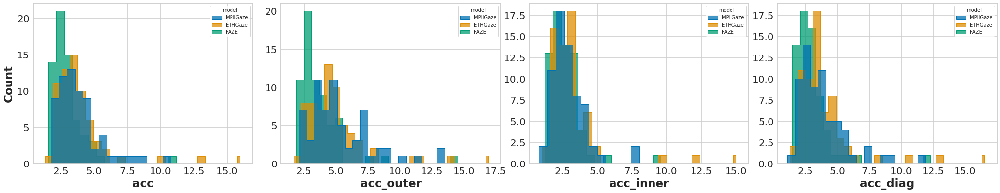

In [4460]:
fig,axs= plt.subplots(1,4, figsize=(35,6)) #non-winsorized
for i, col in enumerate(["acc", "acc_outer", "acc_inner", "acc_diag"]):
    sns.histplot(temp, x = col, element="step", binwidth=0.6, hue="model", multiple="dodge", palette = sns.color_palette("colorblind", 3), ax = axs[i])
    axs[i].set(xlabel=None, ylabel=None)
#     if i==1:
    axs[i].set_xlabel(col,fontsize=23, fontweight = 550)
    if i==0:
        axs[i].set_ylabel("Count",fontsize=23, fontweight = 550)
    axs[i].tick_params(axis='both', which='major', labelsize=20, width = 10)
    
plt.subplots_adjust(wspace=0.13)
# # plt.legend(fontsize=23)
plt.savefig("full_paper_plots/fix_acc_barplots_nonwins.png",dpi=300, transparent=True)

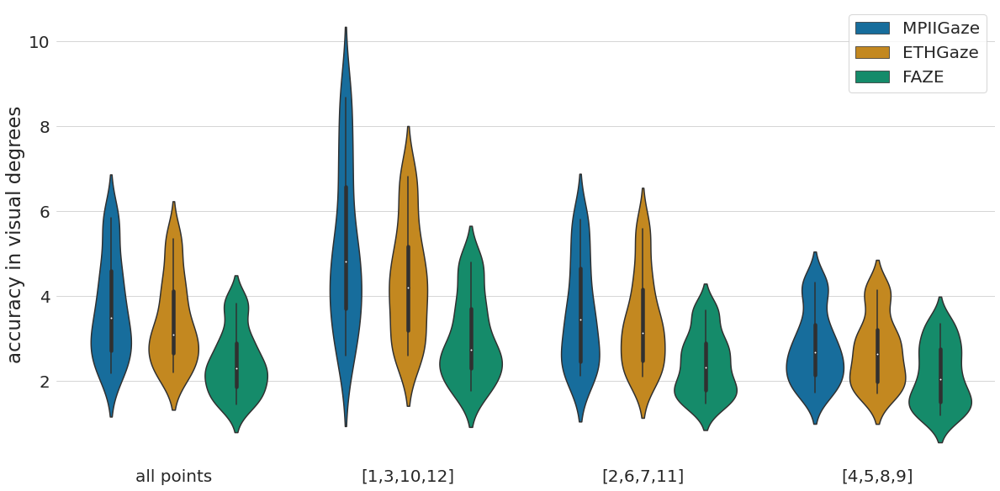

In [4463]:
#winsorized
plt.figure(figsize = (20,10))
ax = sns.violinplot(data = pd.melt(temp, id_vars = ["model","subb"]), x = "variable", y="value", hue="model", palette = sns.color_palette("colorblind", 3), boxprops=dict(alpha=.8), showfliers = False,  showmeans=True, meanprops={"marker":"o", "markerfacecolor":"black", "markeredgecolor":"black"})
sns.despine(left=True, bottom=True)
ax.set_xticklabels(["all points", "[1,3,10,12]", "[2,6,7,11]", "[4,5,8,9]"])
plt.tick_params(axis='both', which='major', labelsize=20, width = 10)
plt.xlabel("",visible=False)
plt.legend( prop={'size': 20})
plt.ylabel("accuracy in visual degrees", fontsize=23, fontweight = 400)
plt.savefig("full_paper_plots/fix_violin_wins.png", transparent = True, dpi= 300)

In [3259]:
model=pred_path.MPII
temp =winsorize(fix_df[model]['rms'], limits=[0.1,0.1])

# print(f" ACC: {np.percentile(temp, [75,25])/54.05}")
print(f" IQR: {np.percentile(temp, [75,25])/54.05}")
# print(f" STD: {winsorize(fix_df[model]['std'], limits=[0.1,0.1]).mean()/54.05}")

 IQR: [2.74831538 1.88086232]


<AxesSubplot:xlabel='subb'>

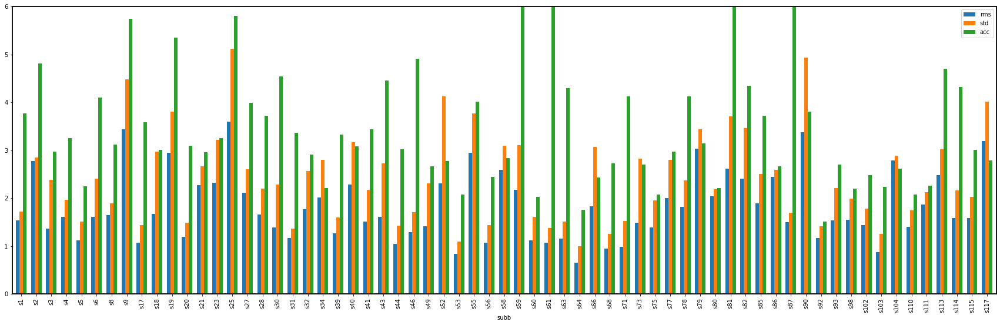

In [163]:
pd.options.plotting.backend = "matplotlib"
temp_df = fix_df[pred_path.ETH].copy()
temp_df.sort_values(by = "subb", key=lambda x: [int(i.strip("s")) for i in x], inplace = True )
temp_df["acc"]/= 54.04
temp_df["rms"]/= 54.04
temp_df["std"]/= 54.04

temp_df.plot(kind='bar', x = "subb", y =["rms","std","acc"], figsize = (30,9), ylim = (0,6), width = 0.7)

# Smooth Pursuit

In [5340]:
import analysis_smooth_pursuit
from importlib import reload
reload(analysis_smooth_pursuit)
from analysis_smooth_pursuit import *


Recording length (ffmpeg):  41.376000
RecStop - RecStart :  41439.0
Total Frame Count :  1244
used Frames Count :  461
FPS :  30.020029440864885
start times :  [5182, 7641, 11112, 14797, 19002, 22168, 24573, 26650, 31114, 33962, 36282, 40166]
stop times :  [6476, 8924, 12389, 16070, 20302, 23434, 25883, 27948, 32380, 35229, 37561, 41447]
click_times :  [4969, 7433, 9929, 14025, 17937, 21953, 24361, 26441, 30401, 33273, 36073, 39681]
diff :  [1294, 1283, 1277, 1273, 1300, 1266, 1310, 1298, 1266, 1267, 1279, 1281]


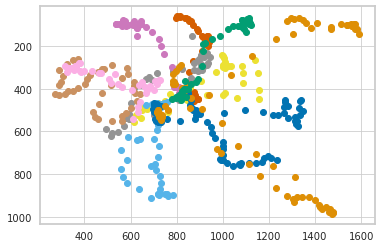

--------------------------------------------------
Recording length (ffmpeg):  30.320000
RecStop - RecStart :  30350.0
Total Frame Count :  912
used Frames Count :  465
FPS :  30.0494233937397
start times :  [1166, 4015, 6647, 9096, 11461, 14078, 16825, 19091, 21474, 24662, 26774, 29053]
stop times :  [2465, 5297, 7930, 10378, 12727, 15376, 18108, 20374, 22739, 25971, 28054, 30367]
click_times :  [956, 3804, 6436, 8748, 11204, 13572, 16124, 18852, 21020, 23340, 26564, 28844]
diff :  [1299, 1282, 1283, 1282, 1266, 1298, 1283, 1283, 1265, 1309, 1280, 1314]


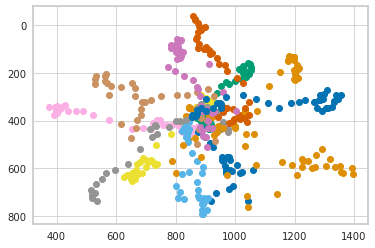

--------------------------------------------------
Recording length (ffmpeg):  30.526000
RecStop - RecStart :  30567.0
Total Frame Count :  918
used Frames Count :  467
FPS :  30.03238786927078
start times :  [1032, 3114, 5698, 8246, 11278, 13383, 15912, 18344, 21707, 24138, 26654, 29270]
stop times :  [2315, 4398, 6981, 9545, 12579, 14660, 17192, 19624, 22990, 25422, 27954, 30584]
click_times :  [820, 2908, 5387, 7540, 10307, 13171, 15668, 17723, 20003, 23820, 26299, 28891]
diff :  [1283, 1284, 1283, 1299, 1301, 1277, 1280, 1280, 1283, 1284, 1300, 1314]


KeyboardInterrupt: 

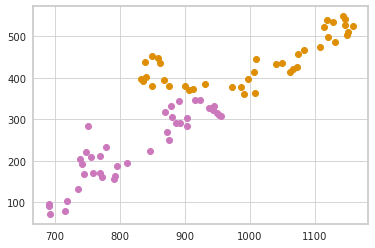

In [4682]:
SP_analyse = Smooth_Pursuit("s55", show=False)
trial_x,trial_y,onsets = SP_analyse.parse_trials(pred_path.FAZE, show = True)

In [19]:
# Plot angles 
# center = [800,450]
# from IPython.display import display, clear_output
# pts = []
# for angle in SP_analyse.angles:
#     X = center[0]+(450*np.cos(angle*np.pi/180))
#     Y = center[1]+(450*np.sin(angle*np.pi/180))
#     pts.append((X,Y))
#     plt.plot([center[0],X],[center[1],Y])
#     plt.xlim(0,1600)
#     plt.ylim(0,900)
#     plt.pause(0.6)
#     clear_output()

In [ ]:
#Save dataframes
SP_df_mpii = subject_wise_SP(subjects, pred_path.MPII)
SP_df_eth = subject_wise_SP(subjects, pred_path.ETH)
SP_df_faze = subject_wise_SP(subjects, pred_path.FAZE)

#Read dataframes
# SP_df_mpii = pd.read_pickle("csv_backup/SP_df_mpii")
# SP_df_eth = pd.read_pickle("csv_backup/SP_df_eth")
# SP_df_faze = pd.read_pickle("csv_backup/SP_df_faze")

 12%|█▏        | 8/65 [01:41<11:30, 12.12s/it]

In [5121]:
SP_df = {pred_path.MPII: SP_df_mpii, pred_path.ETH: SP_df_eth, pred_path.FAZE: SP_df_faze}

In [5113]:
model = pred_path.FAZE #select model for plots/analysis

SP_cmeans = SP_df[model].cmean.apply(pd.Series)
SP_diffs = SP_df[model]['diff'].apply(pd.Series)
SP_cstds = SP_df[model].cstd.apply(pd.Series)
SP_onsets = SP_df[model].onsets.apply(pd.Series)

In [5114]:
SP_diffs[SP_diffs>180] = (SP_diffs[SP_diffs>180] - 360)
mean_diff = SP_diffs.apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=1)
print("mean error : ", winsorize(mean_diff, limits=[0.1,0.1]).mean())
print("IQR : ", np.percentile(mean_diff, [75,25]))

mean error :  8.092855934529453
IQR :  [9.97457999 5.33921609]


In [5011]:
temp = SP_onsets.apply(lambda x: x.explode(), axis=1)
temp = temp.apply(lambda x: winsorize(pd.to_numeric(x, errors="coerce").dropna(), limits=[0.1,0.1]).mean(), axis=1)
print("mean onset : ", winsorize(temp, limits=[0.1,0.1]).mean())
print("IQR : ", np.percentile(temp, [75,25]))

mean onset :  370.85646892655365
IQR :  [423.36666667 324.15      ]


In [2292]:
diff_mean = {}
onset_mean = {}
for angle in SP_cmeans.columns: 
    SP_diffs[SP_diffs>180] = (SP_diffs[SP_diffs>180] - 360)
    diff_mean[angle] = winsorize(SP_diffs[angle], limits=[0.1,0.1]).mean()
    onset_mean[angle] = winsorize(pd.to_numeric(SP_onsets[angle].explode(ignore_index=True), errors='coerce').dropna(), limits=[0.1,0.1]).mean()
#winsorize mean over all trials, over all subjects, over all angles Update: check above cell.... subject aggregation should be last 
print("Mean diff:", winsorize([v for v in diff_mean.values()], limits=[0.1,0.1]).mean())
print("Mean Onset:", winsorize([v for v in onset_mean.values()], limits=[0.1,0.1]).mean())

Mean diff: 8.076937940201843
Mean Onset: 364.8398751530954


MODEL: MPII
mean onset :  281.90093220338986
IQR :  [348.46666667 190.94166667]
na count: 0
MODEL: ETH
mean onset :  309.2751282051282
IQR :  [368.75       267.56666667]
na count: 0
MODEL: FAZE
mean onset :  370.85646892655365
IQR :  [423.36666667 324.15      ]
na count: 0


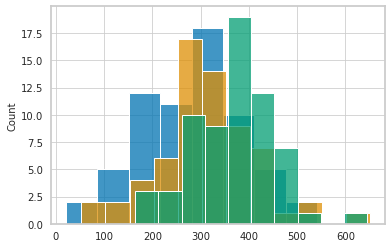

In [5012]:
#Onsets calculated from data between movement start and end gives worse results so taking data from click to end of movement
pal = sns.color_palette("colorblind",3)
for i,model in enumerate(SP_df.keys()):
    SP_onsets = SP_df[model].onsets.apply(pd.Series)
    temp = SP_onsets.apply(lambda x: x.explode(), axis=1)
    temp = temp.apply(lambda x: winsorize(pd.to_numeric(x, errors="coerce").dropna(), limits=[0.1,0.1]).mean(), axis=1)
    print("MODEL:", model.name)
    print("mean onset : ", winsorize(temp, limits=[0.1,0.1]).mean())
    print("IQR : ", np.percentile(temp, [75,25]))
    print("na count:", temp.isna().sum())
    sns.histplot(temp, color = pal[i])

MODEL: MPII
mean onset :  281.90093220338986
IQR :  [348.46666667 190.94166667]
na count: 0
MODEL: ETH
mean onset :  309.2751282051282
IQR :  [368.75       267.56666667]
na count: 0
MODEL: FAZE
mean onset :  370.85646892655365
IQR :  [423.36666667 324.15      ]
na count: 0


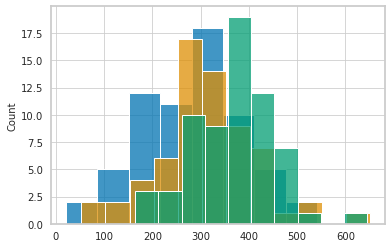

In [4561]:
pal = sns.color_palette("colorblind",3)
for i,model in enumerate(SP_df.keys()):
    SP_onsets = SP_df[model].onsets.apply(pd.Series)
    temp = SP_onsets.apply(lambda x: x.explode(), axis=1)
    temp = temp.apply(lambda x: winsorize(pd.to_numeric(x, errors="coerce").dropna(), limits=[0.1,0.1]).mean(), axis=1)
    print("MODEL:", model.name)
    print("mean onset : ", winsorize(temp, limits=[0.1,0.1]).mean())
    print("IQR : ", np.percentile(temp, [75,25]))
    print("na count:", temp.isna().sum())
    sns.histplot(temp, color = pal[i])

In [ ]:
for subb in tqdm(subjects):
    SP_analyse = Smooth_Pursuit(subb, show=False)
    trial_x,trial_y,onsets = SP_analyse.parse_trials(model, show = False)
    cmean, diff, cstd = mean_angle_preds(trial_x,trial_y, SP_analyse.angles)

    df = df.append({"subb": subb, "trial_x": trial_x, "trial_y": trial_y, "onsets": onsets,"cmean":cmean ,"diff":diff, "cstd":cstd}, ignore_index = True)


Recording length (ffmpeg):  30.031000
file:  Subjects/s18/324096/blockNr_13_taskNr_15_trialNr_4_pursuit_rec.webm
RecStop - RecStart :  30143.0
Total Frame Count :  893
used Frames Count :  459
FPS :  29.625452012075773
start times :  [1180, 3823, 6050, 9139, 11321, 13962, 16162, 18935, 21735, 24478, 26509, 28872]
stop times :  [2475, 5092, 7344, 10444, 12623, 15244, 17444, 20219, 23021, 25796, 27791, 30166]
click_times :  [826, 3608, 5811, 7986, 11106, 13555, 15949, 18169, 20866, 23740, 26300, 28340]
diff :  [1295, 1269, 1294, 1305, 1302, 1282, 1282, 1284, 1286, 1318, 1282, 1294]
(179, 217) [179] [217]
pred_path.MPII
[12, 37, 45]
pred_path.ETH
[16, 37, 45]
pred_path.FAZE
[15, 37, 45]


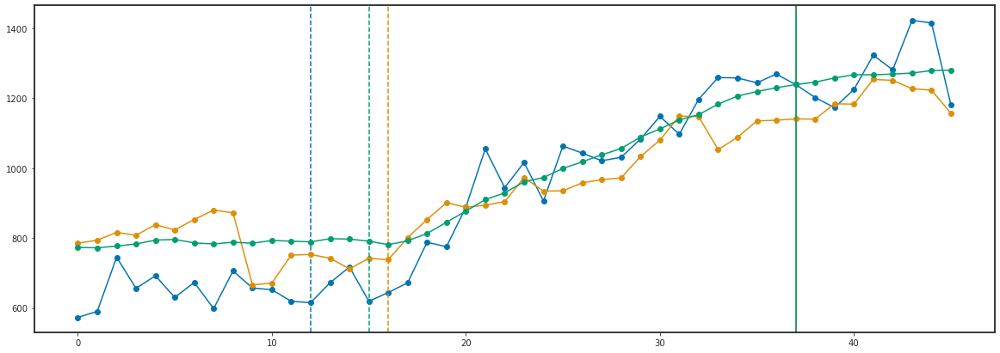

In [5334]:
sp_plot_single_trial("s18", 13, 4, 0)

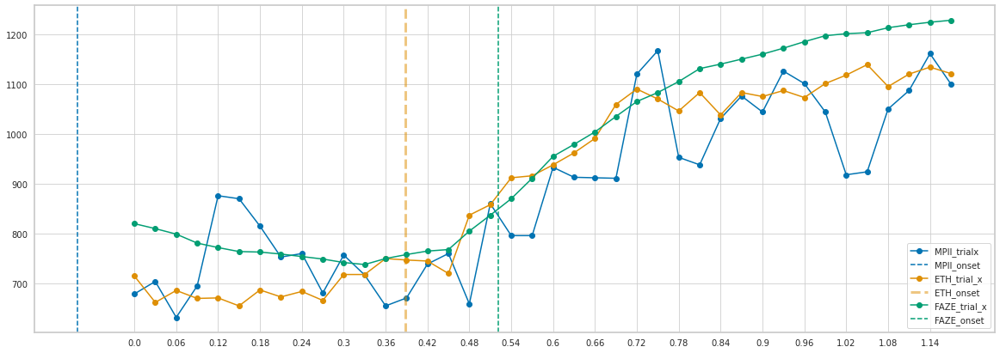

In [4812]:
#plot y or x cordinate for single trial/avg over trials etc to show smooth pursuit initialization
subject = 46; angle=0; trial=9
pal = sns.color_palette("colorblind",3)
SP_df_mpii.trial_x.iloc[subject][angle][trial].reset_index(drop=True).plot(figsize=(20,7), marker="o", color=pal[0])
plt.axvline(SP_df_mpii.onsets.iloc[subject][angle][trial]/30, linestyle = "--", color = pal[0])
SP_df_eth.trial_x.iloc[subject][angle][trial].reset_index(drop=True).plot(figsize=(20,7), marker = "o", color = pal[1])
plt.axvline(SP_df_eth.onsets.iloc[subject][angle][trial]/30, linestyle = "--", color=pal[1], alpha=0.5, linewidth=3)
SP_df_faze.trial_x.iloc[subject][angle][trial].reset_index(drop=True).plot(figsize=(20,7), marker="o", color=pal[2])
plt.axvline(SP_df_faze.onsets.iloc[subject][angle][trial]/30, linestyle = "--", color=pal[2])
plt.xticks(range(0,40,2), [30*frame/1000 for frame in range(0,40,2)])
plt.legend(["MPII_trialx","MPII_onset","ETH_trial_x","ETH_onset","FAZE_trial_x","FAZE_onset"])
# plt.savefig("full_paper_plots/SP_onsets.png", dpi=300)

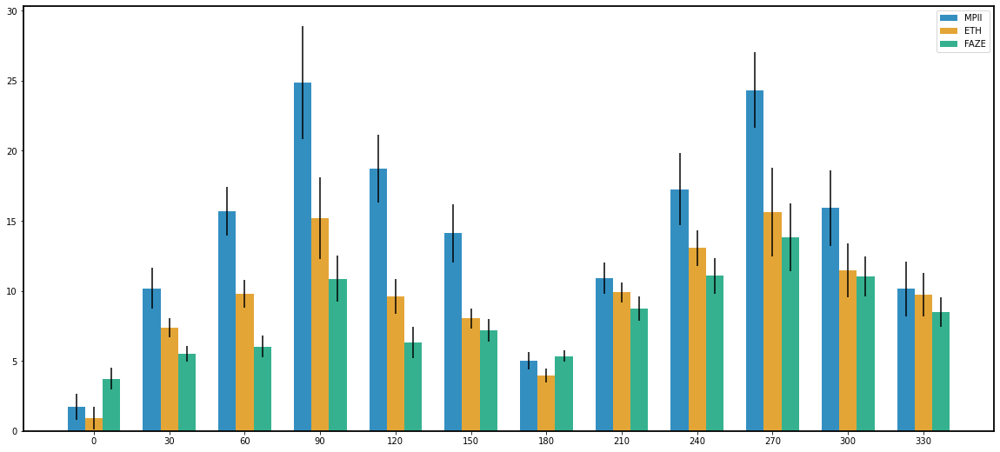

In [2289]:
# fig,axs = plt.subplots(1,3, figsize= (30,6))
plt.figure(figsize=(20,9))
palette = iter(sns.color_palette("colorblind",3))
for i,model in enumerate(SP_df.keys()):
    SP_diffs = SP_df[model]['diff'].apply(pd.Series)
    SP_diffs[SP_diffs>180] = (SP_diffs[SP_diffs>180] - 360)
    mean_diff = SP_diffs.apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)
    plt.bar(mean_diff.index+7*(i-1), mean_diff, width=7, yerr = SP_diffs.std(axis=0)/math.sqrt(65), color = next(palette), alpha=0.8)
    plt.xticks(SP_analyse.angles)
plt.legend(["MPII", "ETH", "FAZE"])
plt.savefig("full_paper_plots/mean_diff_SP.png", dpi=300)

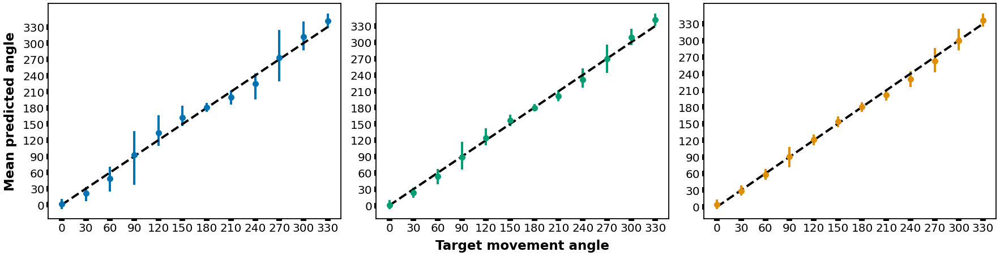

In [3117]:
fig,axs = plt.subplots(1,3, figsize= (30,7))
pal = sns.color_palette("colorblind", 3)
for i,df in enumerate(SP_df.values()):
    SP_cmeans = df.cmean.apply(pd.Series)    
    win_sub_cmean, win_sub_cstd, win_sub_025, win_sub_975 = get_win_sub(SP_cmeans, std_error = False) #over all subjects for each angle
    sp_plot(axs[i], SP_analyse.angles, win_sub_cmean, win_sub_025, win_sub_975, color_err = pal[-i])
#     axs[i].title.set_text(list(SP_df.keys())[i].name)
    if i==1:
        axs[i].set_xlabel("Target movement angle", fontsize=23, fontweight = 550, labelpad=10)
    if i==0:
        axs[i].set_ylabel("Mean predicted angle", fontsize=23, fontweight = 550, labelpad=10)
    axs[i].tick_params(axis='both', which='major', labelsize=20, width = 10)
#     axs[i].set_yticklabels(list(range(0,360,30)),rotation=90, va="center")
plt.subplots_adjust(wspace=0.12)
plt.savefig("full_paper_plots/cmeans_and_error.png", dpi=300, transparent = True)

In [2786]:
win_sub_cmean, win_sub_cstd, win_sub_025, win_sub_975 = get_win_sub(SP_cmeans, std_error = False)

In [2791]:
win_sub_025

{0: 7.377571361799952,
 30: 8.616115015703912,
 60: 9.208191254646415,
 90: 18.539345362935777,
 120: 10.134218245170104,
 150: 10.138433107206026,
 180: 8.68775049056731,
 210: 10.98094520715972,
 240: 15.223596245975273,
 270: 20.148125181080843,
 300: 17.14310490783157,
 330: 11.822470168736174}

In [2796]:
# fig,axs = plt.subplots(1,3, figsize= (30,6))
# pal = sns.color_palette("colorblind",3)
# N = len(SP_analyse.angles)

# for i,df in enumerate(SP_df.values()):
#     SP_cmeans = df.cmean.apply(pd.Series)    
#     win_sub_cmean, win_sub_cstd, win_sub_025, win_sub_975 = get_win_sub(SP_cmeans, std_error = False) #over all subjects for each angle
# #     axs[i].title.set_text(list(SP_df.keys())[i].name)

#     theta = [math.radians(i) for i in list(win_sub_cmean.values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
#     # radii = np.random.uniform(low=9, high=10, size=N)
#     # width = np.pi / 32 * np.fromiter(win_sub_cse.values(), float)
#     width = [math.radians(i) for i in list(win_sub_cstd.values())]
#     # colors = sns.color_palette("colorblind",len(win_sub_cmean))

#     axs[i] = plt.subplot(projection='polar')
#     axs[i].bar(theta, [7.5]*N, width=width, bottom=0.0, color=pal[0], alpha=0.5, label=SP_df.keys()[i].name)
#     axs[i].set_rticks([])
#     axs[i].set_xticks([math.radians(i) for i in SP_analyse.angles])

In [2290]:
cmean_model, cstd_model = {},{}
for i,model in enumerate(SP_df.keys()):
    SP_cmeans = SP_df[model].cmean.apply(pd.Series)    
    cmean_model[model], cstd_model[model], *_ = get_win_sub(SP_cmeans, std_error=True)

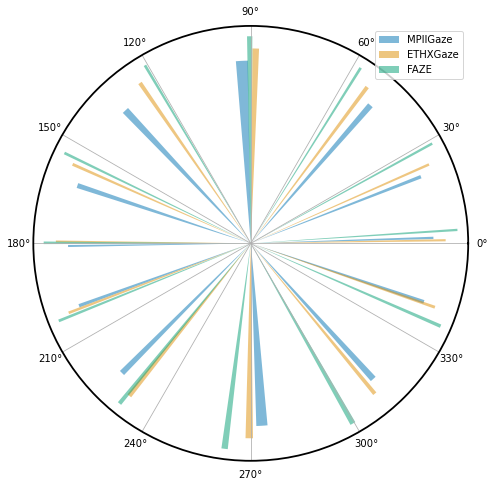

In [347]:
# ALL three models?
pal = sns.color_palette("colorblind",3)
plt.figure(figsize=(8,8))
N = len(SP_analyse.angles)
theta = [math.radians(i) for i in list(cmean_model[pred_path.MPII].values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
# radii = np.random.uniform(low=9, high=10, size=N)
# width = np.pi / 32 * np.fromiter(win_sub_cse.values(), float)
width = [math.radians(i) for i in list(cstd_model[pred_path.MPII].values())]
# colors = sns.color_palette("colorblind",len(win_sub_cmean))

ax = plt.subplot(projection='polar')
ax.bar(theta, [7.5]*N, width=width, bottom=0.0, color=pal[0], alpha=0.5, label="MPIIGaze")
ax.set_rticks([])
ax.set_xticks([math.radians(i) for i in SP_analyse.angles])
# plt.show()

theta = [math.radians(i) for i in list(cmean_model[pred_path.ETH].values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
width = [math.radians(i) for i in list(cstd_model[pred_path.ETH].values())]

# ax = plt.subplot(projection='polar')
ax.bar(theta, [8]*N, width=width, bottom=0.0, color=pal[1], alpha=0.5, label="ETHXGaze")
ax.set_rticks([])
ax.set_xticks([math.radians(i) for i in SP_analyse.angles])

theta = [math.radians(i) for i in list(cmean_model[pred_path.FAZE].values())] #np.linspace(0.0, 2 * np.pi, N, endpoint=False)
width = [math.radians(i) for i in list(cstd_model[pred_path.FAZE].values())]

# ax = plt.subplot(projection='polar')
ax.bar(theta, [8.5]*N, width=width, bottom=0.0, color=pal[2], alpha=0.5, label="FAZE") #CHANGE ALPHA MAKE DARKER
ax.set_rticks([])
ax.set_xticks([math.radians(i) for i in SP_analyse.angles])

ax.legend()
plt.savefig("full_paper_plots/SP_all_models_angles.png", dpi=300)
plt.show()

# Zone Classification

In [2780]:
# from sklearn import metrics

import analysis_zone
from importlib import reload
reload(analysis_zone)
from analysis_zone import *

In [2781]:
#test
zone_analyze = Zone_Classification("s8", show=True)
# trial_x,trial_y = zone_analyze.parse_trials(pred_path.MPII)

did_leave_fullscreen                                                  0.0
FrameEnd                                                  1635887817914.0
FrameStart                                                1635887788015.0
iteration                                                            18.0
pos_hide_time           "times=1635887787968;1635887789531;16358877912...
pos_update_time         "times=1635887787968;1635887789728;16358877914...
recordZone                 blockNr_13_taskNr_12_trialNr_1_recordZone.webm
RecStart                                                              5.0
RecStop                                                           28773.0
seq                                15;10;13;8;5;16;1;14;12;6;4;3;2;7;11;9
Name: 14, dtype: object
sp_df summary 
 None


## Model wise

In [457]:
Zone_df_mpii = subject_wise_Zone(subjects, pred_path.MPII)
Zone_df_eth = subject_wise_Zone(subjects, pred_path.ETH)
Zone_df_faze = subject_wise_Zone(subjects, pred_path.FAZE)

100%|██████████| 65/65 [05:14<00:00,  4.84s/it]


In [2253]:
model = pred_path.MPII #Select model
Zone_df = {pred_path.MPII: Zone_df_mpii, pred_path.ETH: Zone_df_eth, pred_path.FAZE: Zone_df_faze}

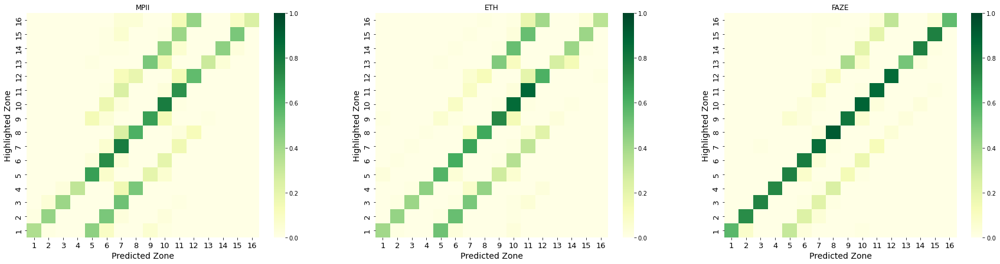

In [556]:
fig,axs = plt.subplots(1,3,figsize=(30,7))
for i,model in enumerate(Zone_df.keys()):
    conf_matrix=get_conf_matrix(Zone_df[model],)
    sns.heatmap(conf_matrix, xticklabels=range(1,17), yticklabels=range(1,17), cmap = "YlGn", vmin = 0, vmax= 1, ax = axs[i])
    axs[i].set_xlabel("Predicted Zone", fontsize=14)
    axs[i].set_ylabel("Highlighted Zone", fontsize=14)
    axs[i].tick_params(axis="both", labelsize=13)
    axs[i].invert_yaxis()
    axs[i].title.set_text(list(Zone_df.keys())[i].name)
    
plt.savefig("full_paper_plots/Zone_conf_matrices.png", dpi=300)

In [2278]:
for model in Zone_df.keys():
    print(model.name)
    print(classification_report(Zone_df[model]))

MPII
              precision    recall  f1-score   support

           1       0.96      0.37      0.53        65
           2       0.88      0.43      0.58        65
           3       0.93      0.42      0.57        65
           4       1.00      0.32      0.49        65
           5       0.51      0.66      0.58        65
           6       0.42      0.72      0.53        65
           7       0.34      0.78      0.47        65
           8       0.45      0.60      0.52        65
           9       0.47      0.66      0.55        65
          10       0.42      0.78      0.55        65
          11       0.42      0.71      0.53        65
          12       0.50      0.55      0.53        65
          13       0.95      0.29      0.45        65
          14       0.91      0.45      0.60        65
          15       0.80      0.49      0.61        65
          16       1.00      0.25      0.40        65

    accuracy                           0.53      1040
   macro avg       0.

In [482]:
# np.sum(np.array(y_true) == np.array(y_pred))/len(y_true) #another way to get accuracy

0.7586538461538461

In [483]:
np.diagonal(get_conf_matrix(Zone_df[pred_path.ETH]))

array([0.4       , 0.43076923, 0.41538462, 0.44615385, 0.58461538,
       0.61538462, 0.64615385, 0.63076923, 0.73846154, 0.86153846,
       0.87692308, 0.6       , 0.26153846, 0.41538462, 0.41538462,
       0.33846154])

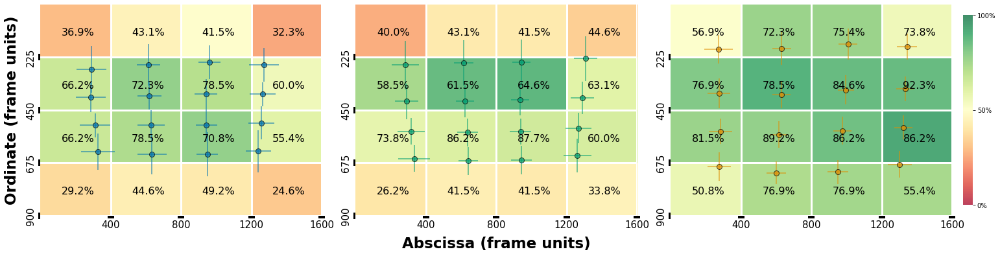

In [3105]:
fig,axs = plt.subplots(1,3,figsize=(30,6))
pal = sns.color_palette("colorblind", 3)
for i,model in enumerate(Zone_df.keys()):
#     axs=axes[0]
    diag = (np.diagonal(get_conf_matrix(Zone_df[model]))).reshape(4,4)
    im = axs[i].imshow(diag, zorder=0, cmap="RdYlGn", aspect="auto", extent=(0,1600, 0 , 900), alpha=0.75, vmin=0, vmax=1) 
#     sns.heatmap(diag, cmap="RdYlGn", annot=True, fmt=".1%", annot_kws={"fontsize":17}, vmin =0, vmax=1, ax = axs[i], xticklabels=[200,600,1000,1400])
    axs[i].set_yticks([0,900//4, 900//2, 3*900//4, 900])
    axs[i].set_xticks([0,1600//4, 1600//2, 3*1600//4, 1600])
#     axs[i].title.set_text(list(Zone_df.keys())[i].name)
    axs[i].invert_yaxis()
#     axs[i].grid(axis="both",which="minor", color="w", linestyle='-', linewidth=8)
    plot_zone((4,4), axs[i], linewidth=3, color="w")
    axs[i].spines[:].set_visible(False)

    for ind in range(16):
        text = axs[i].text(120+(400*(ind//4)), (900/4)*(ind%4)+100, f"{round(diag[ind%4][ind//4]*100,1)}%",
                       ha="left", va="top", color="k", fontsize=16)
    
    
# plt.savefig("full_paper_plots/zone_percent.png", dpi = 300)

    win_sub_x = Zone_df[model].mean_x.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)
    win_sub_y = Zone_df[model].mean_y.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)
    x_err = Zone_df[model].mean_x.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).std(), axis=0)
    y_err = Zone_df[model].mean_y.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).std(), axis=0)
    
#     plot_zone((4,4), axs[0][i])
    for z in range(1,17):
#         axs[0][i].plot(win_sub_x[z],win_sub_y[z], marker="o", markersize = 15, color = "teal")
        axs[i].errorbar(win_sub_x[z], win_sub_y[z], xerr = x_err[z], yerr = y_err[z], color = pal[-i],alpha=0.7, linestyle="None", 
                           marker = "o", markersize=8, markeredgecolor="k")

    if i==1:
        axs[i].set_xlabel("Abscissa (frame units)", fontsize=23, fontweight = 550, labelpad=10)
    if i==0:
        axs[i].set_ylabel("Ordinate (frame units)", fontsize=23, fontweight = 550, labelpad=10)
        
    axs[i].tick_params(axis='both', which='major', labelsize=15, width = 10)
    axs[i].set_yticklabels([225,450,675,900],rotation=90, va="center")
fig.subplots_adjust(wspace=0.12, hspace=0)
cbar = axs[i].figure.colorbar(im, ax=axs[:], shrink=0.9, pad = 0.01, ticks=[0,0.5,1])
cbar.set_ticklabels(["0%","50%","100%"])
cbar.outline.set_visible(False)
plt.savefig("full_paper_plots/zone_err_and_percent.png",dpi=300, transparent = True)

In [2751]:
subb = 5; trial = 4; block=13 #or 6
mpii_trial = pd.read_csv(os.path.join(pred_path.MPII.value, f"s{subb}/pred_allcalib/Block_{block}/Zone Classification{trial}.csv"))
eth_trial = pd.read_csv(os.path.join(pred_path.ETH.value, f"s{subb}/pred_allcalib/Block_{block}/Zone Classification{trial}.csv"))
faze_trial = pd.read_csv(os.path.join(pred_path.FAZE.value, f"s{subb}/pred_allcalib/Block_{block}/Zone Classification{trial}.csv"))

df = pd.read_csv(f"Subjects/s{subb}/data.csv")
seq = df[(df["Task_Name"]=="4. Zone Classification") & (df["Block_Nr"]==block) & (df["Trial_Id"] == trial)].iloc[0].seq

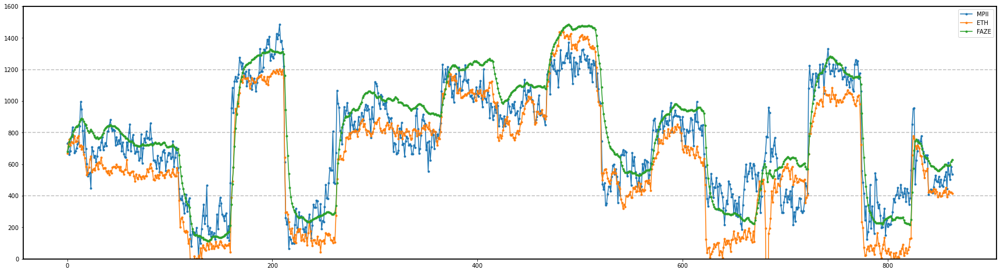

In [585]:
# plt.figure(figsize=(20,8)) ##Plot cordinates with cmap as time scale -> not clear
# plt.scatter(mpii_trial.pred_x, mpii_trial.pred_y, c = sns.light_palette("Teal", 859))
# plt.scatter(eth_trial.pred_x, eth_trial.pred_y, c = sns.light_palette("Orange", 859))
# plt.scatter(faze_trial.pred_x, faze_trial.pred_y, c = sns.light_palette("Green", 859))

mpii_trial.pred_x.plot(figsize=(30,8), marker=".")
# mpii_trial.pred_x.rolling(5).mean().plot(figsize=(30,8), marker=".")
eth_trial.pred_x.plot(figsize=(30,8), marker=".")
# eth_trial.pred_x.rolling(5).mean().plot(figsize=(30,8), marker=".")
faze_trial.pred_x.plot(figsize=(30,8), marker=".")
# faze_trial.pred_x.rolling(5).mean().plot(figsize=(30,8), marker=".")
plt.legend(["MPII","ETH","FAZE"])
plt.axhline(1600/4, linestyle="--", alpha = 0.5, c="gray")
plt.axhline(1600/2, linestyle="--", alpha = 0.5, c="gray")
plt.axhline(1600*3/4, linestyle="--", alpha = 0.5, c="gray")
plt.ylim(0,1600)
plt.savefig("full_paper_plots/zone_x_axis.png",dpi=300)

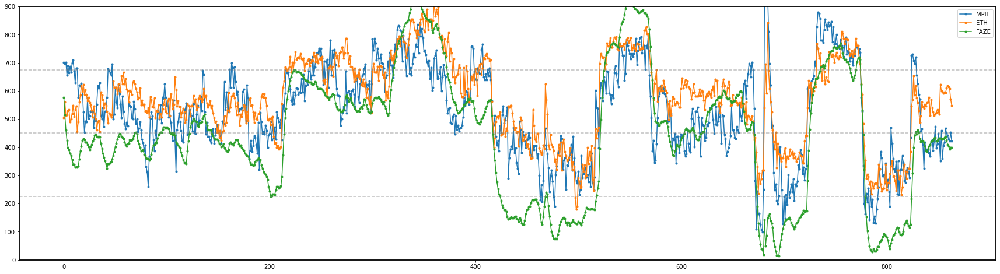

In [588]:
mpii_trial.pred_y.plot(figsize=(30,8), marker=".")
# mpii_trial.pred_y.rolling(5).mean().plot(figsize=(30,8), marker=".")
eth_trial.pred_y.plot(figsize=(30,8), marker=".")
# eth_trial.pred_y.rolling(5).mean().plot(figsize=(30,8), marker=".")
faze_trial.pred_y.plot(figsize=(30,8), marker=".")
# faze_trial.pred_y.rolling(5).mean().plot(figsize=(30,8), marker=".")
plt.legend(["MPII","ETH","FAZE"])
plt.axhline(900/4, linestyle="--", alpha = 0.5, c="gray")
plt.axhline(900/2, linestyle="--", alpha = 0.5, c="gray")
plt.axhline(900*3/4, linestyle="--", alpha = 0.5, c="gray")
plt.ylim(0,900)
plt.savefig("full_paper_plots/zone_y_axis.png",dpi=300)

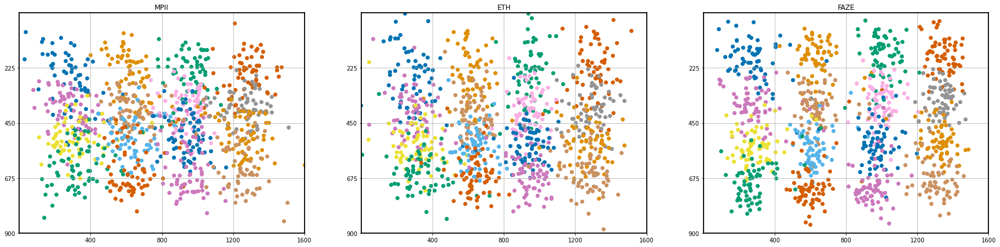

In [597]:
fig,axs = plt.subplots(1,3,figsize=(30,7))
for i,model in enumerate(Zone_df.keys()):
    pallete = iter(sns.color_palette("colorblind", 16))
    mx = Zone_df[model].mean_x.apply(pd.Series)
    my = Zone_df[model].mean_y.apply(pd.Series)
    plot_zone((4,4), axs[i])
    for zone in range(1,17):
        color = next(pallete)
        axs[i].scatter(mx[zone],my[zone],marker="o",color = color)
        axs[i].title.set_text(list(Zone_df.keys())[i].name)
#     print("Zone {} : {}/10".format(zone,c))
    
# plt.save

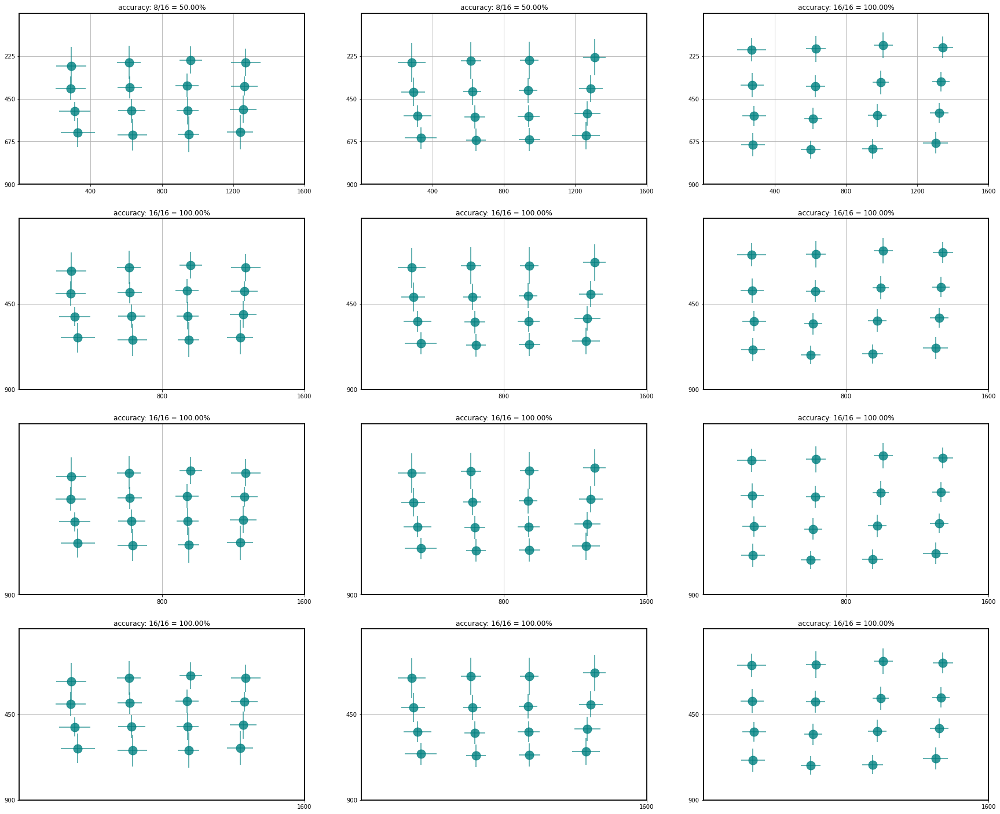

In [2277]:
fig,axs = plt.subplots(4,3, figsize=(30,25))
for i,model in enumerate(Zone_df.keys()):
    win_sub_x = Zone_df[model].mean_x.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)
    win_sub_y = Zone_df[model].mean_y.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).mean(), axis=0)
    x_err = Zone_df[model].mean_x.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).std(), axis=0)
    y_err = Zone_df[model].mean_y.apply(pd.Series).apply(lambda x: winsorize(x, limits=[0.1,0.1]).std(), axis=0)
    
#     pallete = iter(sns.color_palette("colorblind",16))
    c=0
    plot_zone((4,4), axs[0][i])
    for z in range(1,17):
#         axs[0][i].plot(win_sub_x[z],win_sub_y[z], marker="o", markersize = 15, color = "teal")
        axs[0][i].errorbar(win_sub_x[z], win_sub_y[z], xerr = x_err[z], yerr = y_err[z], color = "teal",alpha=0.8, linestyle="None", 
                           marker = "o", markersize=15)
        if get_zone(win_sub_x[z],win_sub_y[z], (4,4)) == z-1:
            c+=1
    axs[0][i].title.set_text("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

#     pallete = iter(sns.color_palette("colorblind",16))
    c=0
    gt = {0:[1,2,5,6],1:[3,4,7,8],2:[9,10,13,14],3:[11,12,15,16]}
    plot_zone((2,2), axs[1][i])
    for z in range(1,17):
        axs[1][i].errorbar(win_sub_x[z], win_sub_y[z], xerr = x_err[z], yerr = y_err[z], color = "teal",alpha=0.8, linestyle="None", 
                           marker = "o", markersize=15)
#         axs[1][i].plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = "teal")
        c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(2,2))]  else 0 )
    axs[1][i].title.set_text("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

#     pallete = iter(sns.color_palette("colorblind",16))
    c=0
    gt = {0:[1,2,5,6,9,10,13,14],1:[3,4,7,8,11,12,15,16]}
    plot_zone((2,1),axs[2][i])
    for z in range(1,17):
        axs[2][i].errorbar(win_sub_x[z], win_sub_y[z], xerr = x_err[z], yerr = y_err[z], color = "teal",alpha=0.8, linestyle="None", 
                           marker = "o", markersize=15)
#         axs[2][i].plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = "teal")
        c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(2,1))] else 0 )
    axs[2][i].title.set_text("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))

#     pallete = iter(sns.color_palette("colorblind",16))
    c=0
    gt = {0:[1,2,5,6,3,4,7,8],1:[9,10,13,14,11,12,15,16]}
    plot_zone((1,2), axs[3][i])
    for z in range(1,17):
        axs[3][i].errorbar(win_sub_x[z], win_sub_y[z], xerr = x_err[z], yerr = y_err[z], color = "teal",alpha=0.8, linestyle="None", 
                           marker = "o", markersize=15)
#         axs[3][i].plot(win_sub_x[z],win_sub_y[z], marker = "o", markersize = 15, color = "teal")
        c = c + ( 1 if z in gt[get_zone(win_sub_x[z],win_sub_y[z],(1,2))//2] else 0 )
    axs[3][i].title.set_text("accuracy: {}/16 = {:0.2f}%".format(c,c*100/16))
# fig.suptitle("MPII, ETH, FAZE", fontsize = 16)
plt.savefig("full_paper_plots/Zone_multi_grid.png", dpi=300)

# FreeView

In [3918]:
import analysis_freeview
from importlib import reload
reload(analysis_freeview)

<module 'analysis_freeview' from '/mnt/beegfs/users/shreshth.saxena/analysis_freeview.py'>

In [3919]:
# reload(analysis_freeview)
from analysis_freeview import *

In [3265]:
#test
FV_analyse = FreeView( "s8", show=False)
# trial_x, trial_y = FV_analyse.parse_trials(pred_path.MPII, analyse_blinks=False)

In [623]:
# FV_df_mpii = subject_wise_FV(subjects,pred_path.MPII)
# FV_df_eth = subject_wise_FV(subjects,pred_path.ETH)
# FV_df_faze = subject_wise_FV(subjects,pred_path.FAZE)

100%|██████████| 65/65 [02:29<00:00,  2.30s/it]


In [3266]:
FV_df = {pred_path.MPII:FV_df_mpii, pred_path.ETH: FV_df_eth, pred_path.FAZE: FV_df_faze}
model = pred_path.MPII #Select_model

In [3421]:
xs = FV_df_mpii.iloc[3].trial_x[4]
ys = FV_df_mpii.iloc[3].trial_y[4]
dist = (xs.diff(1)**2 + ys.diff(1)**2)[1:]**(1/2)

In [3422]:
from st_dbscan import ST_DBSCAN
#normalize
# xs = (xs - xs.min()) / (xs.max() - xs.min())
# ys = (ys - ys.min()) / (ys.max() - ys.min())
data = np.array([range(len(xs)), xs, ys]).T

In [3393]:
help(ST_DBSCAN)

Help on class ST_DBSCAN in module st_dbscan.st_dbscan:

class ST_DBSCAN(builtins.object)
 |  ST_DBSCAN(eps1=0.5, eps2=10, min_samples=5, metric='euclidean', n_jobs=-1)
 |  
 |  A class to perform the ST_DBSCAN clustering
 |  Parameters
 |  ----------
 |  eps1 : float, default=0.5
 |      The spatial density threshold (maximum spatial distance) between 
 |      two points to be considered related.
 |  eps2 : float, default=10
 |      The temporal threshold (maximum temporal distance) between two 
 |      points to be considered related.
 |  min_samples : int, default=5
 |      The number of samples required for a core point.
 |  metric : string default='euclidean'
 |      The used distance metric - more options are
 |      ‘braycurtis’, ‘canberra’, ‘chebyshev’, ‘cityblock’, ‘correlation’,
 |      ‘cosine’, ‘dice’, ‘euclidean’, ‘hamming’, ‘jaccard’, ‘jensenshannon’,
 |      ‘kulsinski’, ‘mahalanobis’, ‘matching’, ‘rogerstanimoto’, ‘sqeuclidean’,
 |      ‘russellrao’, ‘seuclidean’, ‘sokal

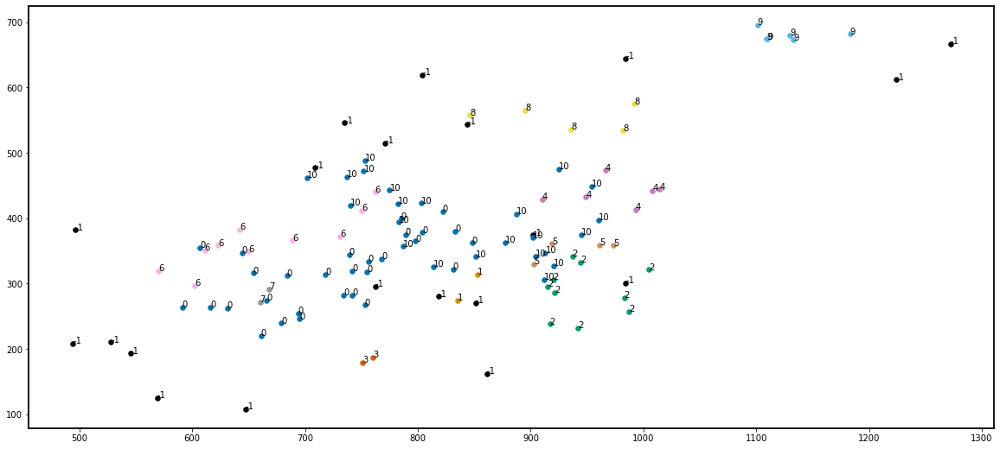

In [3444]:
st_dbscan = ST_DBSCAN(eps1 = 54, eps2 = 15, min_samples = 2).fit(data)
plt.figure(figsize=(20,9))
def plot(data, labels):
    colors = sns.color_palette("colorblind",len(labels))
    
    for i in range(-1, len(set(labels))):
        if i == -1:
            col = [0, 0, 0, 1]
        else:
            col = colors[i % len(colors)]
        
        clust = data[np.where(labels==i)]
        plt.scatter(clust[:,0], clust[:,1], c=[col], s=30)
#         for pos in range(clust.shape[0]):
#             plt.annotate(str(i), (clust[pos,0], clust[pos,1]+0.4))
        
    plt.show()

    return None
plot(data[:,1:], st_dbscan.labels)

In [3445]:
st_dbscan.labels

array([-1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  1,  1,  2,  2, -1,  2,  2,  2,  2,  2,  2,  2,  2,
        0,  0,  0,  0, -1,  0, -1,  3, -1,  3,  0,  0,  0,  0, -1,  4,  5,
        5,  5,  5,  4,  4,  4,  4,  4,  0,  6,  6,  6, -1,  7,  6, -1,  6,
        6, -1,  7,  6,  6,  6,  6,  8, -1, -1,  8, -1, -1,  8,  8,  8,  9,
        9,  9,  9,  9,  9, -1, -1, 10, 10, 10, 10, 10, 10, 10, -1, 10, -1,
       10, 10, 10, 10, 10, 10, -1, 10, 10, 10, 10, 10, -1, 10, 10, 10, 10])

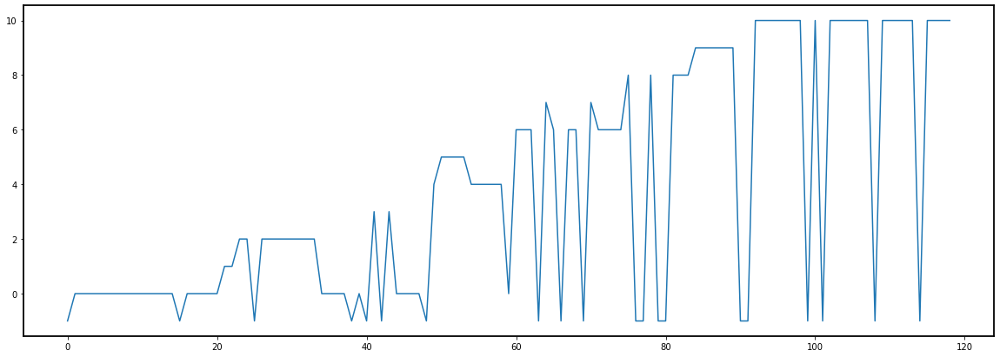

In [3446]:
plt.figure(figsize=(20,7))
plt.plot(st_dbscan.labels)

In [3991]:
reload(analysis_freeview)
from analysis_freeview import *

Trial_Id 2 image name i102423191


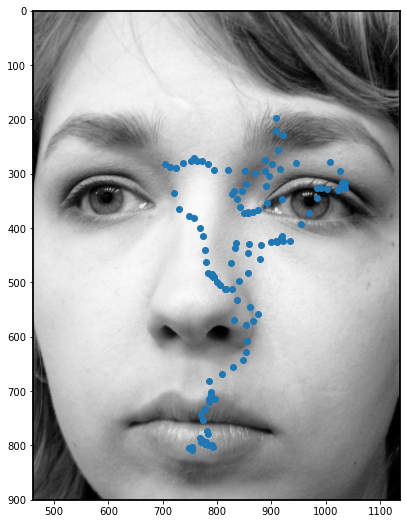

In [4009]:
#Single trial from single subject plot
image_no = 2
subject_no = 45
model = pred_path.FAZE
plot_one_subject(image_no,FV_df[model].iloc[subject_no].trial_x[image_no],FV_df[model].iloc[subject_no].trial_y[image_no], marker = "o", ls = '')
plt.gca().invert_yaxis()

Trial_Id 2 image name i102423191


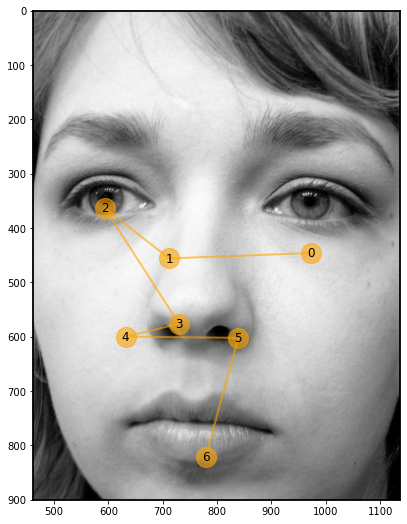

In [4011]:
#applying event classification with ST-DBSCAN
image_no = 2 #1-16
subject_no = 45
model = pred_path.MPII

data = np.array([range(FV_df[model].iloc[subject_no].trial_x[image_no].shape[0]), FV_df[model].iloc[subject_no].trial_x[image_no], FV_df[model].iloc[subject_no].trial_y[image_no]]).T
centroids = DB_centroids(data, model); assert len(centroids)>0, "No fixations found (after removing first fix and outliers)"
plot_one_subject(image_no,centroids[:,0],centroids[:,1], text=True, ms=20, marker = "o", c='orange', alpha=0.6, linewidth = 2)
plt.gca().invert_yaxis()

Trial_Id 1 image name i05june05_static_street_boston_p1010806


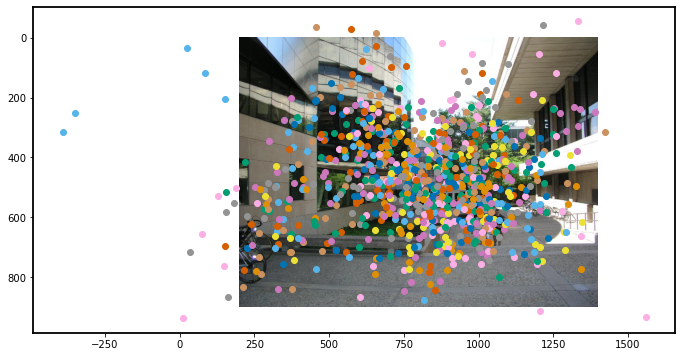

Trial_Id 2 image name i102423191
subject 11, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


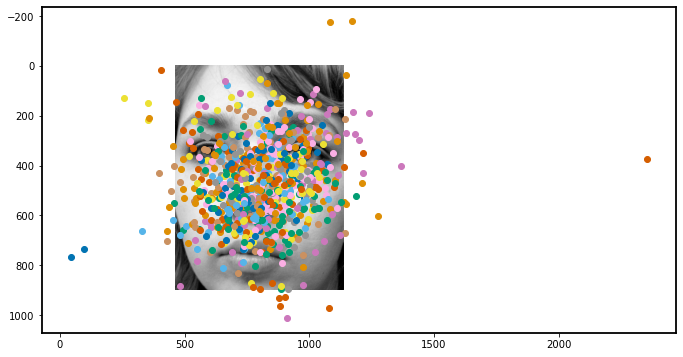

Trial_Id 3 image name i110996888


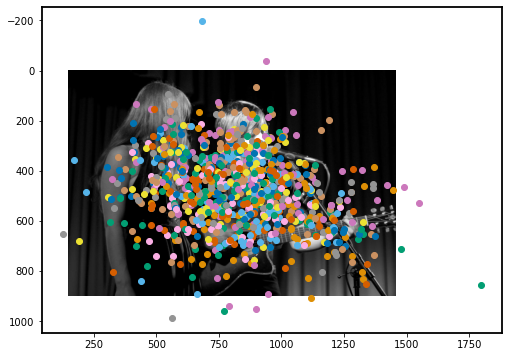

Trial_Id 4 image name i1126243635


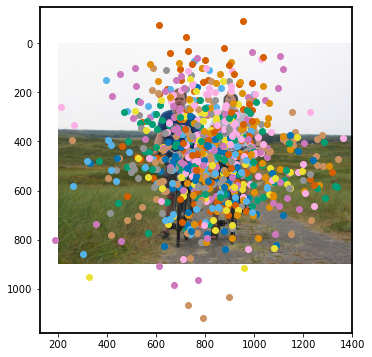

Trial_Id 5 image name i1142164052


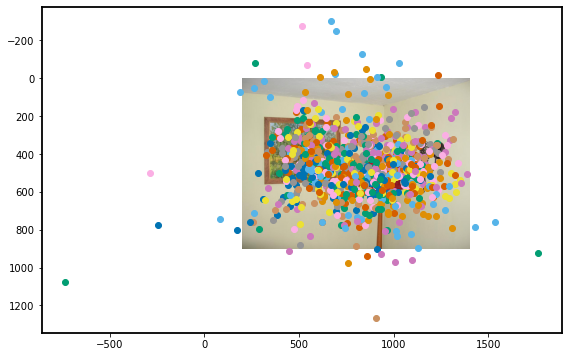

Trial_Id 6 image name i1158892521
subject 11, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed
subject 28, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


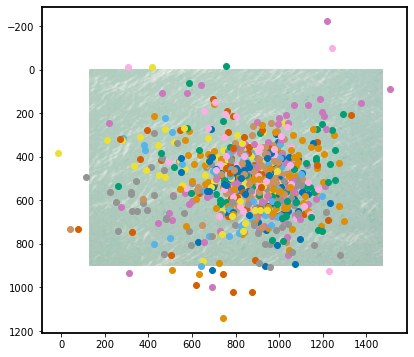

Trial_Id 7 image name i117772445


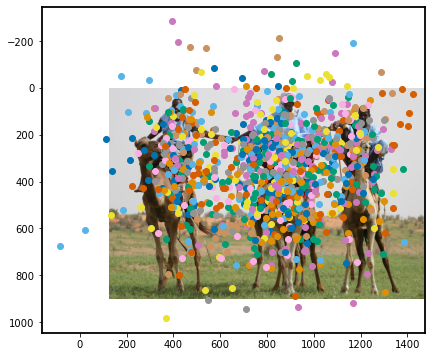

Trial_Id 8 image name i12030916


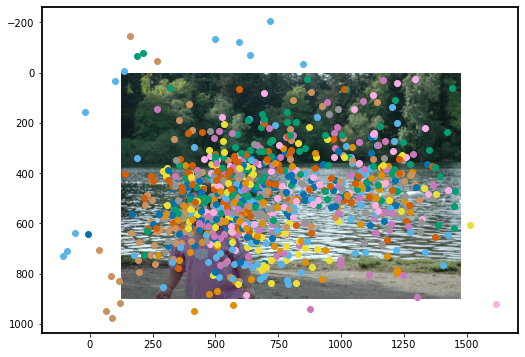

Trial_Id 9 image name i12049788
subject 11, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


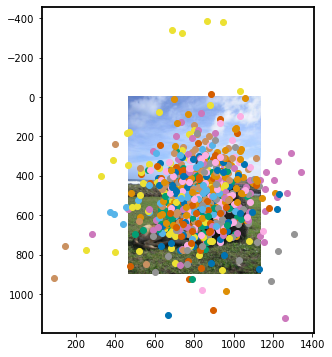

Trial_Id 10 image name i132419257
subject 28, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


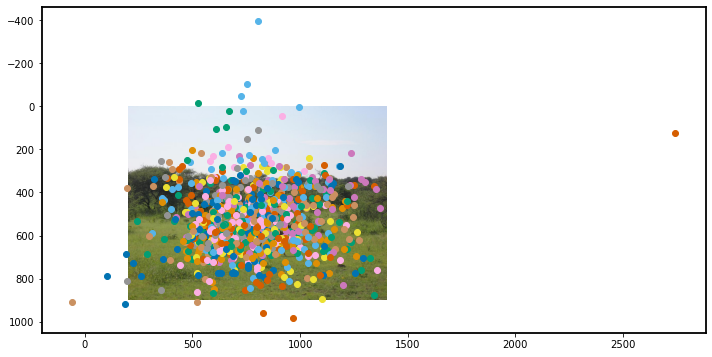

Trial_Id 11 image name i14020903
subject 25, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


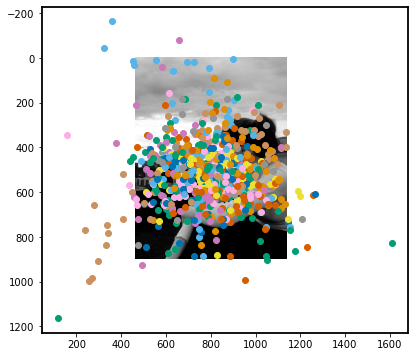

Trial_Id 12 image name i1508828


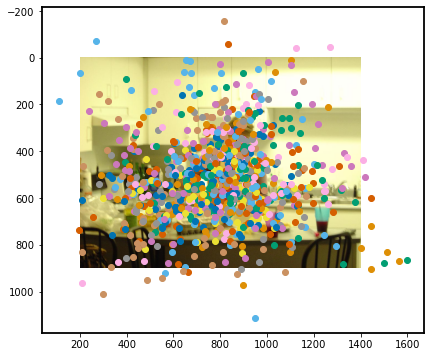

Trial_Id 13 image name i2057541
subject 28, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


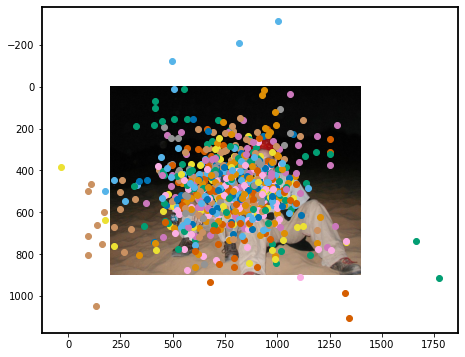

Trial_Id 14 image name i2234959271
subject 28, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


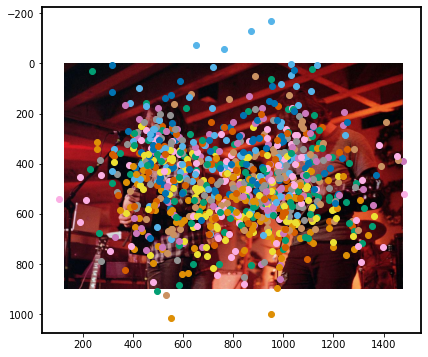

Trial_Id 15 image name i40576393


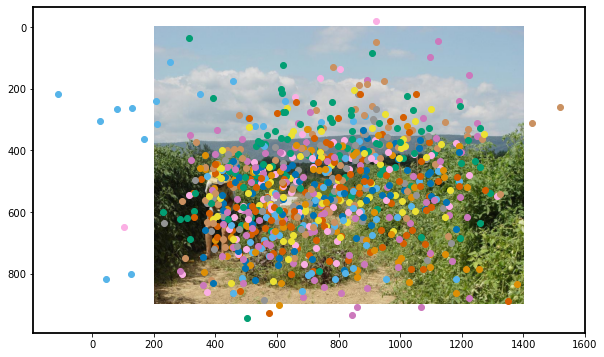

Trial_Id 16 image name i4466881
subject 28, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed
subject 64, centroids: 0, exception: too many indices for array: array is 1-dimensional, but 2 were indexed


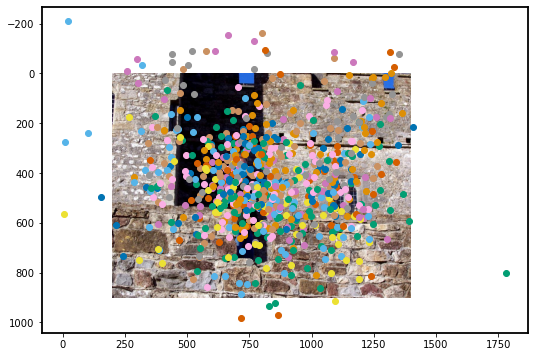

In [3925]:
model = pred_path.ETH
plot_all_subjects(FV_df[model], model)

In [9]:
#Using Gaussian filter instead
# import scipy
# def KDE_plot(x,y):
#     #adjust data range if needed
#     xd = x
#     yd = y

#     values = np.vstack([xd,yd])
#     kernel = scipy.stats.gaussian_kde(values)#, bw_method = 54/std_2D(x,y)) #54 fu is one degree of vis angle

#     xi, yi = np.mgrid[0:1600:1600j,0:900:900j]
#     # xi,yi = np.mgrid[xd.min():xd.max():(xd.max()-xd.min())*1j, yd.min():yd.max():(yd.max() - yd.min())*1j]
#     zi = kernel(np.vstack([xi.ravel(), yi.ravel()]))
#     Z = np.reshape(zi.T, xi.shape)
    
#     return np.flip(np.rot90(Z),0)

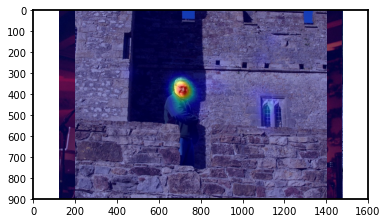

In [2373]:
for i, model in enumerate(FV_df.keys()):
    x_pts = FV_df[model].trial_x.apply(pd.Series)
    y_pts = FV_df[model].trial_y.apply(pd.Series)
    for trial in range(1,17): 
        img_name = FV_IMAGES[trial]
        img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
        img,xbounds,ybounds = labVanced_present(img)
#         axs[trial][i].figure(figsize=(8,6))
        plt.xlim(0,1600)
        plt.ylim(0,900)
        plt.gca().invert_yaxis()
        plt.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
        
#         for x,y in zip(x_pts[7],y_pts[7]): #can use different colors subjectwise
    #         plt.scatter(x,y, color = "#CE7D1E", alpha = 0.3)

#         indices = np.zeros((900,1600)) #presentation size
#         indices[pd.to_numeric(y_pts[trial].explode(ignore_index=True).dropna().clip(0,indices.shape[0]-1)).to_list(),pd.to_numeric(x_pts[trial].explode(ignore_index=True).dropna().clip(0,indices.shape[1]-1)).to_list()] = 1 #marking gazepoints
#         indices = indices[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
#         pred_heatmap = gaussian_filter(indices,sigma=54)*255  #Sigma = 1 visual degree (54 fu)
#         plt.imshow(pred_heatmap, cmap = cm.jet, extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin = "lower", alpha = 0.45)

        gt_heatmap = cv2.imread("FreeView_maps/"+img_name+"_fixMap.jpg", cv2.IMREAD_GRAYSCALE)
        gt_heatmap = imutils.resize(gt_heatmap,height = 900, inter=cv2.INTER_CUBIC) #bi-cubic/nearest is what Matlab imresize() does by default
        plt.imshow(gt_heatmap,cmap = cm.jet, extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower", alpha = 0.45)
        plt.savefig(f"osna/{img_name}.png")

In [3926]:
# for trial in range(1,17): 
#         img_name = FV_IMAGES[trial]
#         img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
#         img,xbounds,ybounds = labVanced_present(img)
#         plt.xlim(0,1600)
#         plt.ylim(0,900)
# #         plt.invert_yaxis()
#         plt.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
        # plt.gca().invert_yaxis()
#         plt.show()

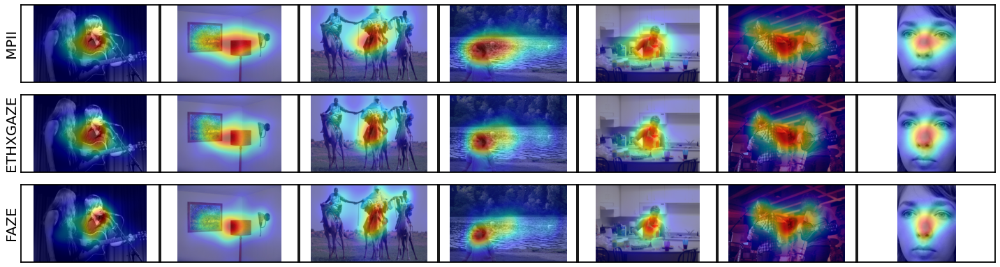

In [3211]:
## Save predictions 
from scipy.ndimage import gaussian_filter
import matplotlib.cm as cm
# for model in [pred_path.MPII, pred_path.FAZE, pred_path.ETH]:
# model=pred_path.FAZE
fig, axs = plt.subplots(3,7, figsize = (25,7))
for i, model in enumerate(FV_df.keys()):
    x_pts = FV_df[model].trial_x.apply(pd.Series)
    y_pts = FV_df[model].trial_y.apply(pd.Series)
    for ax,trial in enumerate([2,3,5,7,8,12,14]): 
        img_name = FV_IMAGES[trial]
        img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
        img,xbounds,ybounds = labVanced_present(img)
#         axs[trial][i].figure(figsize=(8,6))
        axs[i][ax-1].set_xlim(0,1600)
        axs[i][ax-1].set_ylim(0,900)
        axs[i][ax-1].invert_yaxis()
        axs[i][ax-1].imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
        
#         for x,y in zip(x_pts[7],y_pts[7]): #can use different colors subjectwise
    #         plt.scatter(x,y, color = "#CE7D1E", alpha = 0.3)

        indices = np.zeros((900,1600)) #presentation size
        indices[pd.to_numeric(y_pts[trial].explode(ignore_index=True).dropna().clip(0,indices.shape[0]-1)).to_list(),pd.to_numeric(x_pts[trial].explode(ignore_index=True).dropna().clip(0,indices.shape[1]-1)).to_list()] = 1 #marking gazepoints
        indices = indices[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
        pred_heatmap = gaussian_filter(indices,sigma=54)*255  #Sigma = 1 visual degree (54 fu)
        axs[i][ax-1].imshow(pred_heatmap, cmap = cm.jet, extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin = "lower", alpha = 0.45)
        axs[i][ax-1].tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)
#     plt.savefig(f"freeview_plots_brownbag/{img_name}.png")
#PLOT GT
# for trial in range(1,17): 
#     img_name = FV_IMAGES[trial]
#     img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
#     img,xbounds,ybounds = labVanced_present(img)
# #         axs[trial][i].figure(figsize=(8,6))
#     axs[trial-1][3].set_xlim(0,1600)
#     axs[trial-1][3].set_ylim(0,900)
#     axs[trial-1][3].invert_yaxis()
#     axs[trial-1][3].imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])

#     gt_heatmap = cv2.imread(
#         "FreeView_maps/"+img_name+"_fixMap.jpg", cv2.IMREAD_GRAYSCALE)
#     gt_heatmap = imutils.resize(gt_heatmap,height = 900, inter=cv2.INTER_CUBIC) #bi-cubic/nearest is what Matlab imresize() does by default
#     axs[trial-1][3].imshow(gt_heatmap,cmap = cm.jet, extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower", alpha = 0.45)
# fig.tight_layout()
axs[0][0].set_ylabel("MPII", fontsize=20, fontweight = 450) #fontsize=23, fontweight = 550, labelpad=10
axs[1][0].set_ylabel("ETHXGAZE", fontsize=20, fontweight = 450)
axs[2][0].set_ylabel("FAZE", fontsize=20, fontweight = 450)
plt.subplots_adjust(hspace=0.05, wspace=0.01)
plt.savefig("full_paper_plots/FreeView_cobined_low.png", transparent=True, dpi=300)


In [3955]:
x_pts = FV_df[model].trial_x.apply(pd.Series)
y_pts = FV_df[model].trial_y.apply(pd.Series) 

for trial in range(1,17)[:1]:
    centroids = np.empty((0,2))
    for subject in x_pts.index[:]:
        data = (pd.concat([x_pts[trial][subject], y_pts[trial][subject]], axis = 1).reset_index().values)
        centroids = np.append( centroids, DB_centroids(data, model), axis = 0)
        print(centroids.shape)

(9, 2)
(25, 2)
(40, 2)
(56, 2)
(76, 2)
(93, 2)
(107, 2)
(114, 2)
(129, 2)
(143, 2)
(158, 2)
(165, 2)
(185, 2)
(192, 2)
(205, 2)
(219, 2)
(234, 2)
(247, 2)
(263, 2)
(284, 2)
(288, 2)
(296, 2)
(311, 2)
(330, 2)
(351, 2)
(365, 2)
(377, 2)
(391, 2)
(392, 2)
(405, 2)
(429, 2)
(439, 2)
(455, 2)
(472, 2)
(500, 2)
(512, 2)
(532, 2)
(549, 2)
(559, 2)
(570, 2)
(580, 2)
(594, 2)
(610, 2)
(620, 2)
(632, 2)
(644, 2)
(658, 2)
(676, 2)
(690, 2)
(702, 2)
(715, 2)
(736, 2)
(745, 2)
(755, 2)
(766, 2)
(778, 2)
(786, 2)
(801, 2)
(812, 2)
(825, 2)
(838, 2)
(844, 2)
(854, 2)
(861, 2)
(874, 2)


In [3990]:
centroids.astype(int)

array([[ 959,  449],
       [1169,  432],
       [ 906,  400],
       ...,
       [ 382,  486],
       [ 242,  692],
       [ 682,  596]])

Trial_Id 1 image name i05june05_static_street_boston_p1010806
AUC       0.5818622506005839
CC        0.5742272393512402
SIM       0.4503603530290491


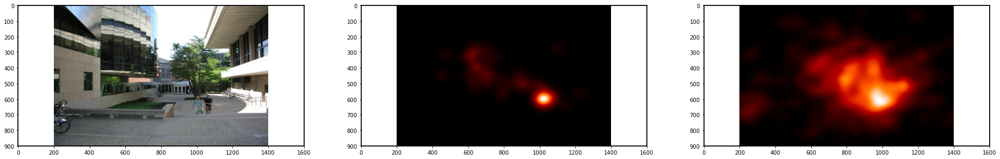

Trial_Id 2 image name i102423191
AUC       0.565280788609624
CC        0.4896903991238058
SIM       0.4286190871337224


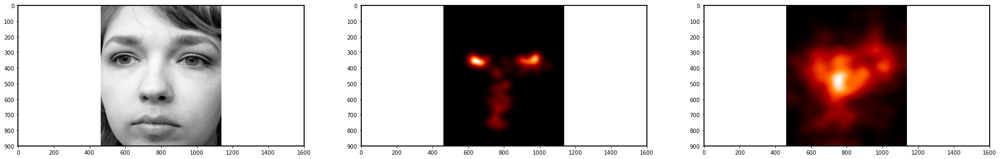

Trial_Id 3 image name i110996888
AUC       0.5531066467126474
CC        0.4680423215653519
SIM       0.39810052005067


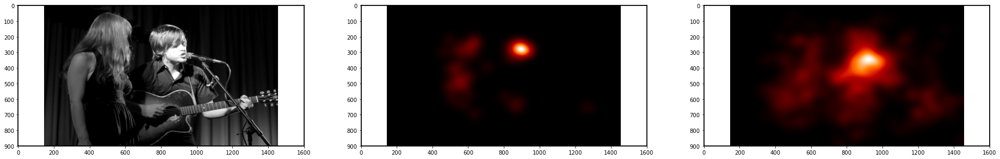

Trial_Id 4 image name i1126243635
AUC       0.5921027100208361
CC        0.5161526572813785
SIM       0.4059248321928005


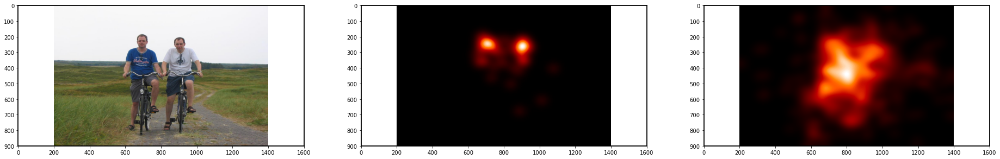

Trial_Id 5 image name i1142164052
AUC       0.5656454721004657
CC        0.5801151777145293
SIM       0.41782605928330807


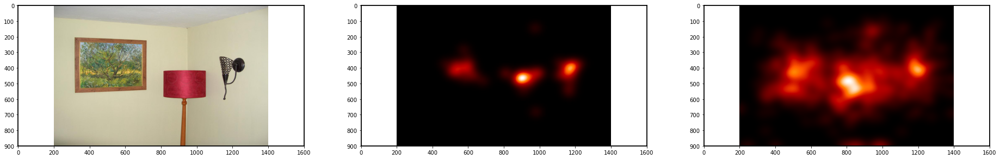

Trial_Id 6 image name i1158892521
AUC       0.7278164386864232
CC        0.7318587221608852
SIM       0.5270171835374743


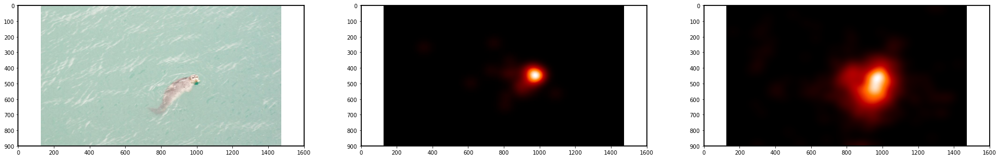

Trial_Id 7 image name i117772445
AUC       0.5848796207873995
CC        0.5544660332379177
SIM       0.43113186309735624


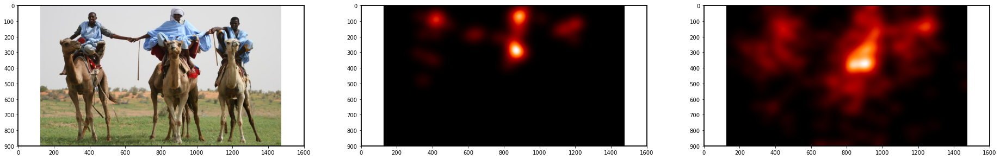

Trial_Id 8 image name i12030916
AUC       0.6695893551600183
CC        0.7569893800481554
SIM       0.5116184686029249


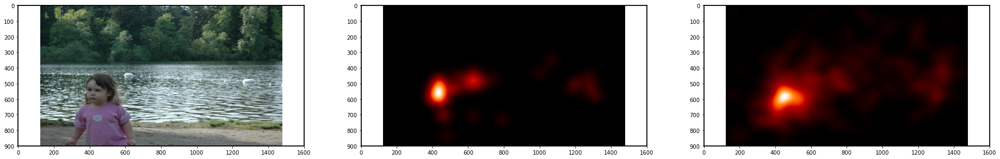

Trial_Id 9 image name i12049788
AUC       0.606649248892845
CC        0.6535945000328094
SIM       0.4757858953669197


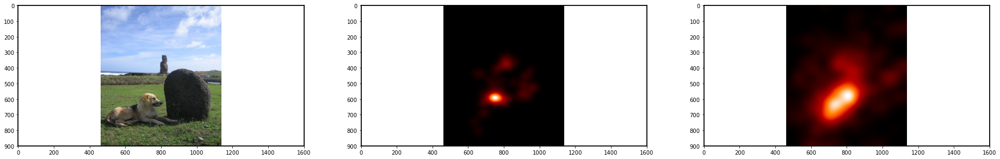

Trial_Id 10 image name i132419257
AUC       0.5545188227674125
CC        0.5804466931171012
SIM       0.4244824852175016


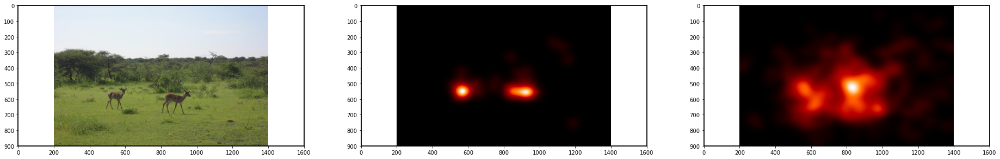

Trial_Id 11 image name i14020903
AUC       0.589141006818672
CC        0.42589957095292297
SIM       0.41178302413133644


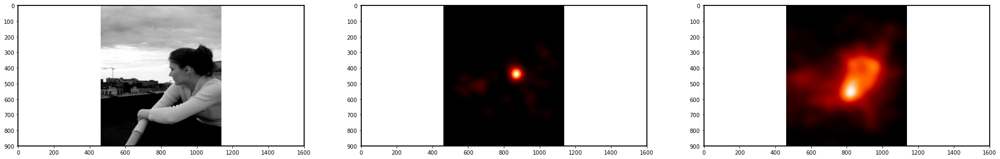

Trial_Id 12 image name i1508828
AUC       0.676709145702816
CC        0.6356042887253363
SIM       0.5299943331341337


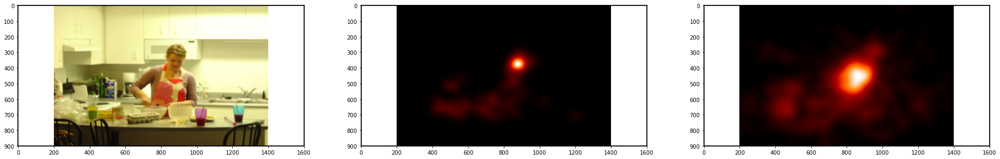

Trial_Id 13 image name i2057541
AUC       0.6452086103901201
CC        0.611515312182082
SIM       0.4668045184812902


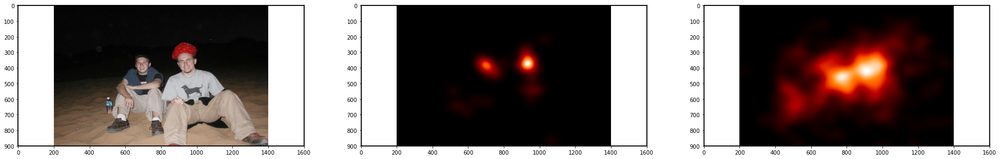

Trial_Id 14 image name i2234959271
AUC       0.5758072063041337
CC        0.5920621840697411
SIM       0.432618447763196


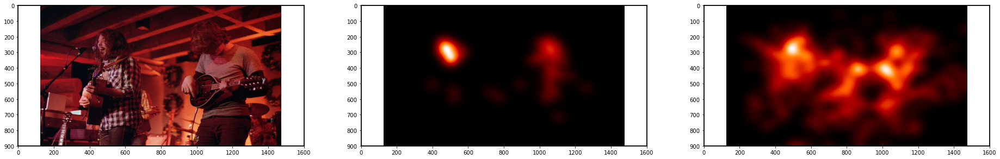

Trial_Id 15 image name i40576393
AUC       0.5964170594253778
CC        0.6694280889424995
SIM       0.49885299952298695


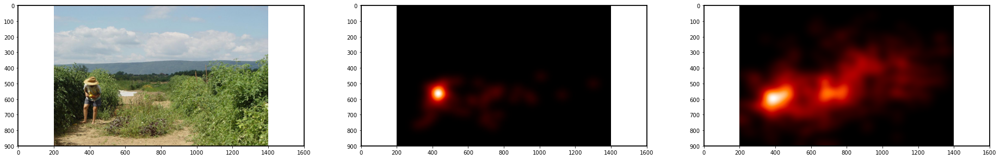

Trial_Id 16 image name i4466881
AUC       0.6271231054165076
CC        0.6601000488459948
SIM       0.45696854039761353


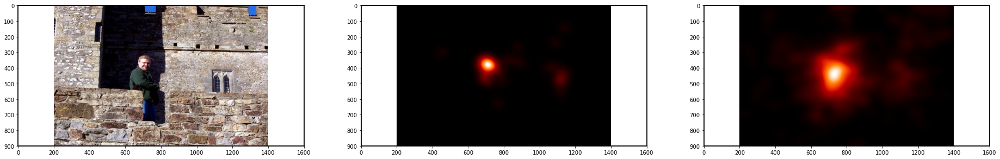

In [4008]:
from scipy.ndimage import gaussian_filter
model = pred_path.FAZE
auc, cc, sim = [],[],[]
for trial in range(1,17):
    fig,ax = plt.subplots(1,3, figsize=(32,18))
    img_name = FV_IMAGES[trial]
#     palette = iter(sns.color_palette)
    print("Trial_Id", trial, "image name", img_name)
    
    #Plot image
    img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
    img,xbounds,ybounds = labVanced_present(img)
    ax[0].imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
    x_pts = FV_df[model].trial_x.apply(pd.Series)
    y_pts = FV_df[model].trial_y.apply(pd.Series) 
    
    #get centroids for all subjects
    centroids = np.empty((0,2), int)
    for subject in x_pts.index:
        data = (pd.concat([x_pts[trial][subject], y_pts[trial][subject]], axis = 1).reset_index().values)
        centroids = np.append( centroids, DB_centroids(data, model), axis = 0)


    #Plot ground truth heatmap
    gt_heatmap = cv2.imread(
        "FreeView_maps/"+img_name+"_fixMap.jpg", cv2.IMREAD_GRAYSCALE)
    gt_heatmap = imutils.resize(gt_heatmap,height = 900, inter=cv2.INTER_CUBIC) #bi-cubic/nearest is what Matlab imresize() does by default
    ax[1].imshow(gt_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
    
    # using gaus blurring below, alternatively can also use kernel density estimation (similar results but takes much more time)
#     Z = KDE_plot(x=x_pts[trial].explode(ignore_index=True).dropna().to_list(), y=y_pts[trial].explode(ignore_index=True).dropna().to_list())
#     kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
#     ax[2].imshow(kde_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
# #     ax[2] = sns.kdeplot(x=pd.concat(x, ignore_index=True), y=pd.concat(y, ignore_index=True), cmap="gray", shade=True, thresh=0.5, fill = True, clip=[xbounds, ybounds])

    #Plot Predicted heatmap      
    indices = np.zeros((900,1600)) #presentation size
    indices[centroids[:,1].clip(0,indices.shape[0]-1), centroids[:,0].clip(0,indices.shape[1]-1)] = 1
#     indices[data[trial].explode(ignore_index=True).dropna().apply(lambda x: x[0]).clip(0,indices.shape[0]-1).to_list(),data[trial].explode(ignore_index=True).dropna().apply(lambda x: x[1]).clip(0,indices.shape[1]-1).to_list()] = 1 #marking gazepoints
    indices = indices[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
    pred_heatmap = gaussian_filter(indices,sigma=54)*255  #Sigma = 1 visual degree (54 fu)
    ax[2].imshow(pred_heatmap, cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin = "lower")
 
    auc.append(AUC_Judd(gt_heatmap,indices))
    cc.append(CC(gt_heatmap, pred_heatmap))
    sim.append(SIM(gt_heatmap, pred_heatmap))
    print("{:10}{}".format("AUC",auc[-1]))
    print("{:10}{}".format("CC",cc[-1]))
    print("{:10}{}".format("SIM",sim[-1]))
    
    
    for i in range(3):
        ax[i].set_xlim(0,1600)
        ax[i].set_ylim(0,900)
        ax[i].invert_yaxis()
        ax[i].set_aspect(14/16)
#     plt.gca().invert_yaxis()
    plt.show()
    
# ax.set_frame_on(False)
# # fig.savefig('kde.png', transparent=True, bbox_inches='tight', pad_inches=0)

Trial_Id 1 image name i05june05_static_street_boston_p1010806
AUC       0.5587445358696002
CC        0.4720349818617099
SIM       0.42132568724797653


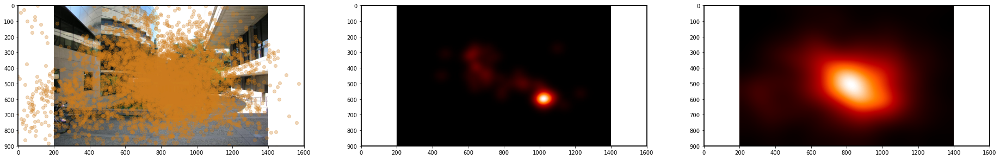

Trial_Id 2 image name i102423191
AUC       0.5010427128233698
CC        0.29460319005035507
SIM       0.3470082080552031


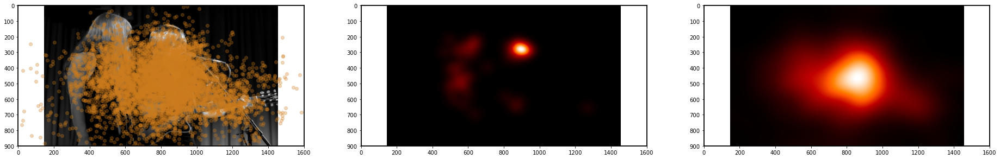

Trial_Id 4 image name i1126243635
AUC       0.5520585968436643
CC        0.3281684119073208
SIM       0.3332216442226493


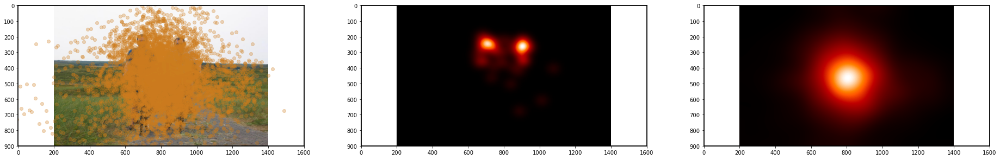

Trial_Id 5 image name i1142164052
AUC       0.5289699686987741
CC        0.4523822938035461
SIM       0.3551323171048574


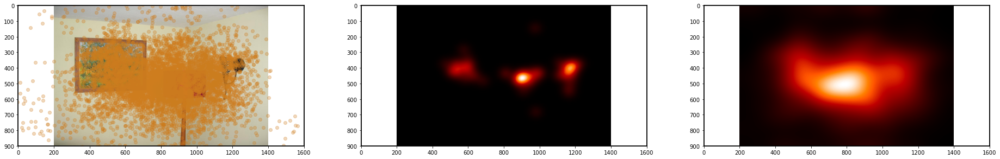

Trial_Id 6 image name i1158892521
AUC       0.5934129395628436
CC        0.520115162680154
SIM       0.3968208754245729


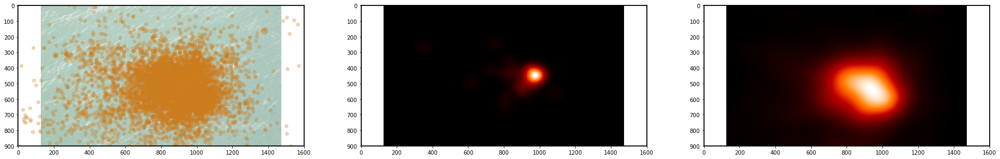

Trial_Id 7 image name i117772445
AUC       0.4153594854911664
CC        0.31703631317727093
SIM       0.31970952551135307


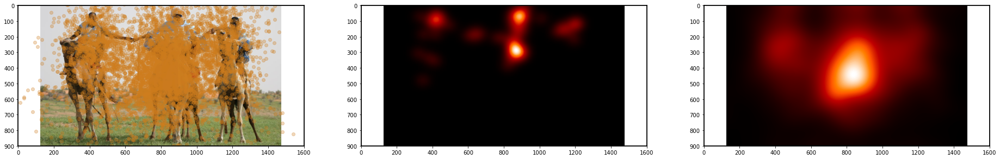

Trial_Id 8 image name i12030916
AUC       0.5599663098317945
CC        0.634736479746877
SIM       0.40967783759077087


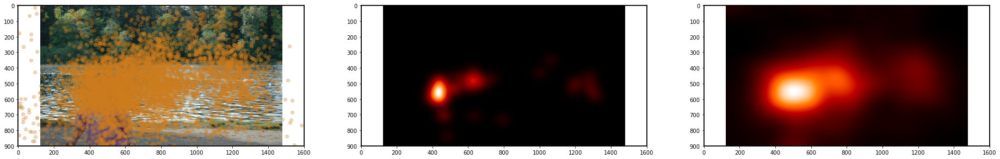

Trial_Id 9 image name i12049788
AUC       0.5840565884581652
CC        0.5543632169749141
SIM       0.45201957524525377


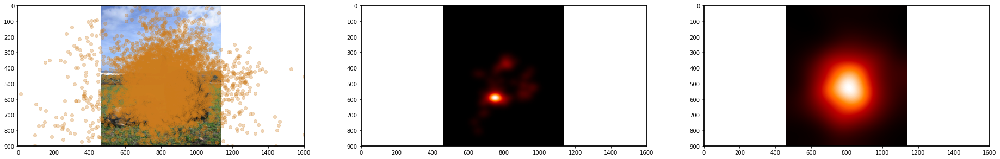

Trial_Id 10 image name i132419257
AUC       0.5526120709475173
CC        0.4922349733246753
SIM       0.37030653622758075


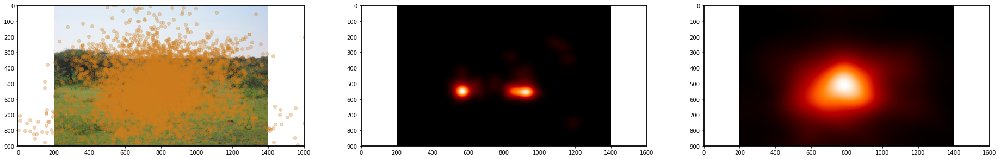

Trial_Id 11 image name i14020903
AUC       0.5564350358116611
CC        0.4151206301180533
SIM       0.38849215724114844


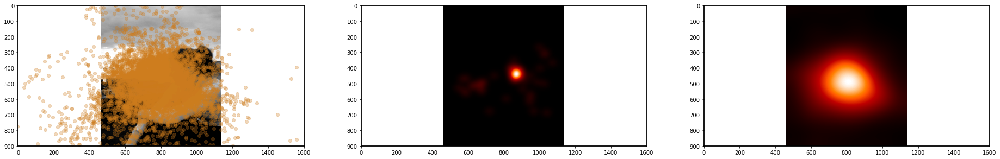

Trial_Id 12 image name i1508828
AUC       0.6081760815777221
CC        0.553860215043049
SIM       0.47105788313996055


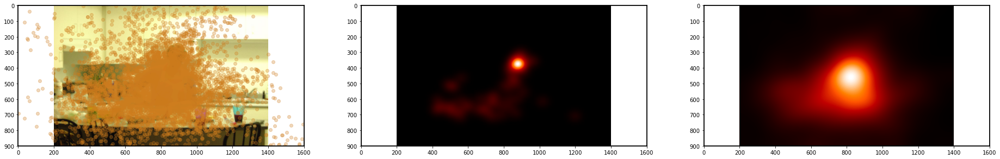

Trial_Id 13 image name i2057541
AUC       0.5961630187239527
CC        0.43021048593574635
SIM       0.38812557311238616


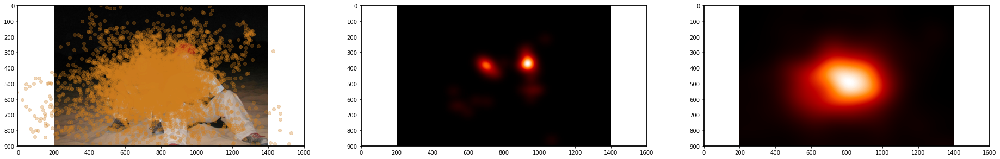

Trial_Id 14 image name i2234959271
AUC       0.5474411584245391
CC        0.3608995515885669
SIM       0.3512307651368781


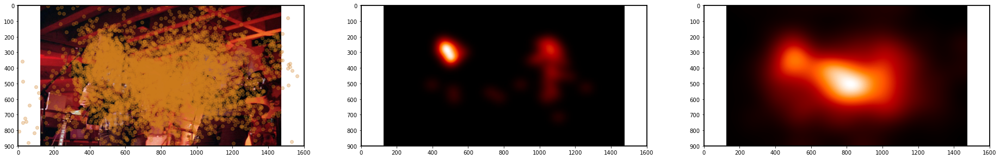

Trial_Id 15 image name i40576393
AUC       0.5522475698584182
CC        0.43715507185877706
SIM       0.4264397665037771


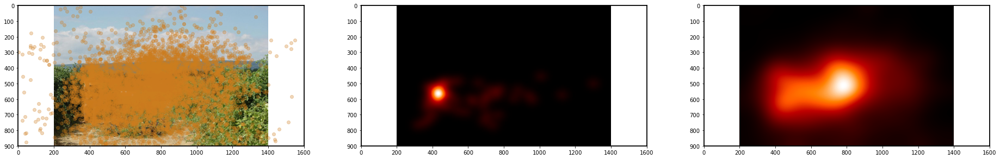

Trial_Id 16 image name i4466881
AUC       0.5263020610766748
CC        0.5163611505382631
SIM       0.35615203495398057


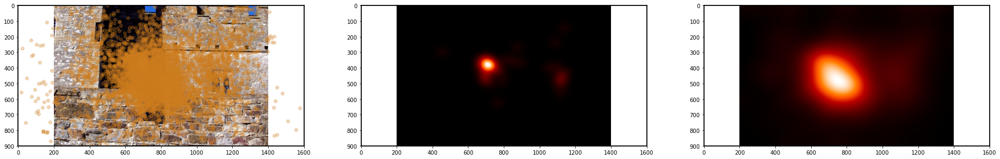

In [778]:
from scipy.ndimage import gaussian_filter
model = pred_path.ETH
auc, cc, sim = [],[],[]
for trial in range(1,17):
    fig,ax = plt.subplots(1,3, figsize=(32,18))
    img_name = FV_IMAGES[trial]
#     palette = iter(sns.color_palette)
    print("Trial_Id", trial, "image name", img_name)
    
    #Plot image
    img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
    img,xbounds,ybounds = labVanced_present(img)
    ax[0].imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])
    x_pts = FV_df[model].trial_x.apply(pd.Series)
    y_pts = FV_df[model].trial_y.apply(pd.Series) 
    
    for trial in x_pts.columns:
        for subject in x_pts.index:
            x_pts[trial][subject] = (pd.concat([x_pts[trial][subject], y_pts[trial][subject]], axis = 1).reset_index().values)
    
    data = x_pts.applymap(lambda x: get_centroids(x))
    
    #remove first 10 preds to deal with center fixation?
#     x_pts = x_pts.applymap(lambda x: x[10:])
#     y_pts = y_pts.applymap(lambda x: x[10:])
    
    for x,y in zip(x_pts[trial],y_pts[trial]): #can use different colors subjectwise
        ax[0].scatter(x,y, color = "#CE7D1E", alpha = 0.3)

    #Plot ground truth heatmap
    gt_heatmap = cv2.imread(
        "FreeView_maps/"+img_name+"_fixMap.jpg", cv2.IMREAD_GRAYSCALE)
    gt_heatmap = imutils.resize(gt_heatmap,height = 900, inter=cv2.INTER_CUBIC) #bi-cubic/nearest is what Matlab imresize() does by default
    ax[1].imshow(gt_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
    
    # using gaus blurring below, alternatively can also use kernel density estimation (similar results but takes much more time)
#     Z = KDE_plot(x=x_pts[trial].explode(ignore_index=True).dropna().to_list(), y=y_pts[trial].explode(ignore_index=True).dropna().to_list())
#     kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
#     ax[2].imshow(kde_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
# #     ax[2] = sns.kdeplot(x=pd.concat(x, ignore_index=True), y=pd.concat(y, ignore_index=True), cmap="gray", shade=True, thresh=0.5, fill = True, clip=[xbounds, ybounds])

    #Plot Predicted heatmap      
    indices = np.zeros((900,1600)) #presentation size
    indices[data[trial].explode(ignore_index=True).dropna().apply(lambda x: x[0]).clip(0,indices.shape[0]-1).to_list(),data[trial].explode(ignore_index=True).dropna().apply(lambda x: x[1]).clip(0,indices.shape[1]-1).to_list()] = 1 #marking gazepoints
    indices = indices[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
    pred_heatmap = gaussian_filter(indices,sigma=54)*255  #Sigma = 1 visual degree (54 fu)
    ax[2].imshow(pred_heatmap, cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin = "lower")
                      
    auc.append(AUC_Judd(gt_heatmap,indices))
    cc.append(CC(gt_heatmap, pred_heatmap))
    sim.append(SIM(gt_heatmap, pred_heatmap))
    print("{:10}{}".format("AUC",auc[-1]))
    print("{:10}{}".format("CC",cc[-1]))
    print("{:10}{}".format("SIM",sim[-1]))
    
    
    for i in range(3):
        ax[i].set_xlim(0,1600)
        ax[i].set_ylim(0,900)
        ax[i].invert_yaxis()
        ax[i].set_aspect(14/16)
#     plt.gca().invert_yaxis()
    plt.show()
    
# ax.set_frame_on(False)
# # fig.savefig('kde.png', transparent=True, bbox_inches='tight', pad_inches=0)

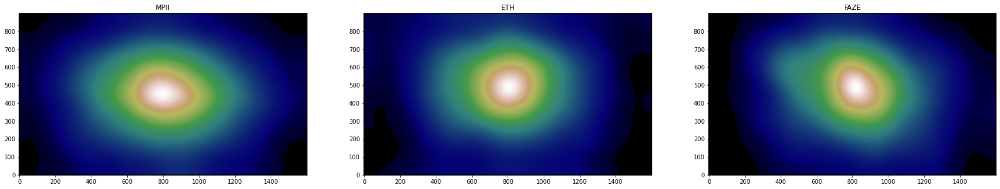

In [773]:
# #Center bias
fig,axs = plt.subplots(1,3, figsize=(30,7))
for i,model in enumerate(FV_df.keys()):
    pts_x = FV_df[model].trial_x.apply(lambda x: [i for value in x.values() for i in value]).explode().reset_index(drop=True)
    pts_y = FV_df[model].trial_y.apply(lambda x: [i for value in x.values() for i in value]).explode().reset_index(drop=True)
    # plt.plot(pts_x, pts_y)

    indices = np.zeros((900,1600)) #presentation size
    indices[pts_y.astype(int).clip(0,indices.shape[0]-1).to_list(),pts_x.astype(int).clip(0,indices.shape[1]-1).to_list()] = 1 #marking gazepoints
    # indices = indices[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
    pred_heatmap = gaussian_filter(indices,sigma=54)*255  #Sigma = 1 visual degree (54 fu)
    axs[i].imshow(pred_heatmap, cmap = plt.get_cmap("gist_earth"), origin = "lower")
    axs[i].title.set_text(model.name)
plt.savefig("full_paper_plots/FV_centerbias.png", dpi=300)

### Test

In [746]:
FV_df_eth.trial_x.iloc[6][6]

0       978
1       956
2       942
3       978
4      1022
5       979
6       992
7       976
8       998
9      1074
10     1076
11     1067
12     1016
13     1040
14      993
15      985
16     1003
17     1005
18      976
19     1019
20     1013
21     1008
22     1003
23     1041
24     1033
25     1044
26     1079
27     1075
28     1041
29     1060
30     1038
31     1072
32     1066
33     1055
34     1015
35     1018
36     1019
37     1020
38     1000
39     1009
40     1045
41     1005
42      992
43      999
44     1034
45     1022
46     1026
47     1050
48     1034
49     1041
50     1077
51     1070
52     1068
53     1062
54     1067
55     1079
56     1084
57     1057
58     1056
59     1036
60     1023
61     1029
62     1007
63      995
64     1030
65     1033
66     1017
67      972
68      981
69     1003
70     1014
71     1026
72     1044
73     1129
74     1205
75     1212
76     1230
77     1271
78      944
79     1082
80     1069
81     1032
82     1052
83  

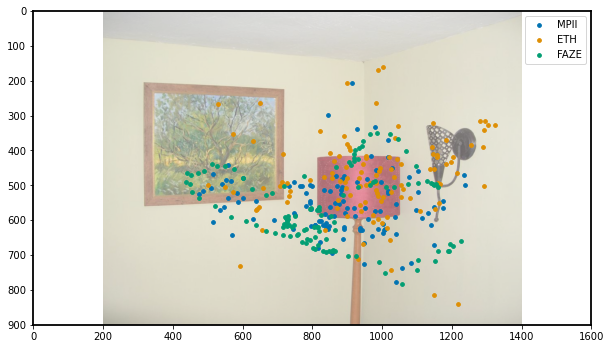

In [772]:
#Plot a random subject trial

subb = 4; image = 5
img_name = FV_IMAGES[image]
img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
img,xbounds,ybounds = labVanced_present(img)
plt.figure(figsize=(10,18))
plt.xlim(0,1600)
plt.ylim(0,900)
plt.gca().invert_yaxis()
plt.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], alpha=0.6)

pal = iter(sns.color_palette("colorblind",3))
for model in FV_df.keys():
    x_pts = FV_df[model].trial_x.iloc[subb][image]
    y_pts = FV_df[model].trial_y.iloc[subb][image]
    plt.scatter(x_pts, y_pts, marker="o", s=14, color=next(pal))#sns.light_palette(next(pal), 118))
plt.legend(["MPII","ETH","FAZE"])
# for x,y in zip(x_pts[7],y_pts[7]): #can use different colors subjectwise
#     plt.scatter(x,y, color = "#CE7D1E", alpha = 0.3)
plt.savefig("full_paper_plots/FV_single_trial.png", dpi=300)

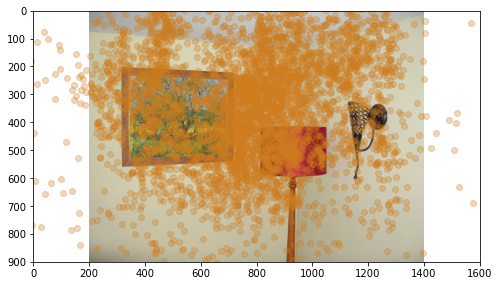

In [383]:
#Plot all gaze points
img_name = FV_IMAGES[5]
img = cv2.imread("FreeView_Images/"+img_name+".jpeg")
img,xbounds,ybounds = labVanced_present(img)
plt.figure(figsize=(8,6))
plt.xlim(0,1600)
plt.ylim(0,900)
plt.gca().invert_yaxis()
plt.imshow(imutils.opencv2matplotlib(img), origin="lower", extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])

x_pts = FV_df_eth.trial_x.apply(pd.Series)
y_pts = FV_df_eth.trial_y.apply(pd.Series) 
for x,y in zip(x_pts[7],y_pts[7]): #can use different colors subjectwise
    plt.scatter(x,y, color = "#CE7D1E", alpha = 0.3)

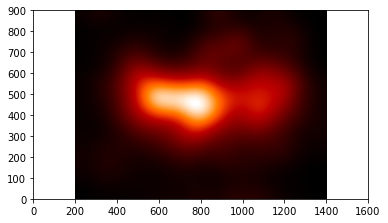

In [384]:
#Using Gaussian blur
from scipy.ndimage import gaussian_filter
arr = np.zeros((900,1600)) #presentation size
arr[pd.to_numeric(y_pts[5].explode(ignore_index=True)).dropna().clip(0,arr.shape[0]-1).to_list(),pd.to_numeric(x_pts[5].explode(ignore_index=True)).dropna().clip(0,arr.shape[1]-1).to_list()] = 1 #marking gazepoints
arr = arr[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]] #cropping to image size (removing padding)
blur = gaussian_filter(arr,sigma=54)*255
plt.xlim(0,1600)
plt.ylim(0,900)
plt.imshow(blur, cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]])

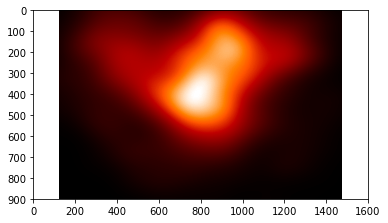

In [599]:
#plotting KDE
# Z = KDE_plot(x=x_pts[7].explode(ignore_index=True).dropna().to_list(), y=y_pts[7].explode(ignore_index=True).dropna().to_list())
# kde_heatmap = Z[ybounds[0]:ybounds[1], xbounds[0]:xbounds[1]]
plt.xlim(0,1600)
plt.ylim(0,900)
plt.imshow(kde_heatmap,cmap = plt.get_cmap("gist_heat"), extent = [xbounds[0],xbounds[1],ybounds[0],ybounds[1]], origin="lower")
plt.gca().invert_yaxis()

# Blinks

In [3226]:
import analysis_blinks
reload(analysis_blinks)
from analysis_blinks import *

In [3227]:
blink_analyse = Blink_Detect("s3")#, penalty_ruptures = 0.3)

Trial_Id                                                                1
beep_times              "times=1633948060426;1633948062013;16339480635...
beepEndTimes            "times=1633948060426;1633948062184;16339480636...
BlinkRec                     blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Condition_Id                                                            1
did_leave_fullscreen                                                  0.0
FrameEnd                                                  1633948074533.0
FrameStart                                                1633948060461.0
iter                    "times=1633948060426;1633948062186;16339480636...
next_time               "times=1633948060462;1633948062184;16339480636...
random                  "times=1633948060426;1633948060462;16339480621...
RecStart                                                              1.0
Name: 7, dtype: object
blinks_df summary 
 None


Recording Name :  blockNr_13_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.543000
RecStop - RecStart :  13587.0
Frame Count :  405
FPS :  29.807904614705233
start times :  [1551, 3053, 4687, 6356, 8059, 9791, 11400]
inter-beat duration :  [1502, 1634, 1669, 1703, 1732, 1609] Avg:  1641.5
blinks :  [(348, 371), (302, 320), (55, 63), (198, 215), (143, 156), (250, 258), (395, 398), (100, 106), (330, 334), (170, 175)]
No. of blinks :  10
Latencies:  [301, 301, 134, 301, 335, 369, 301]
Blink durations :  [771, 603, 268, 570, 436, 268, 100, 201, 134, 167] Avg:  351.8


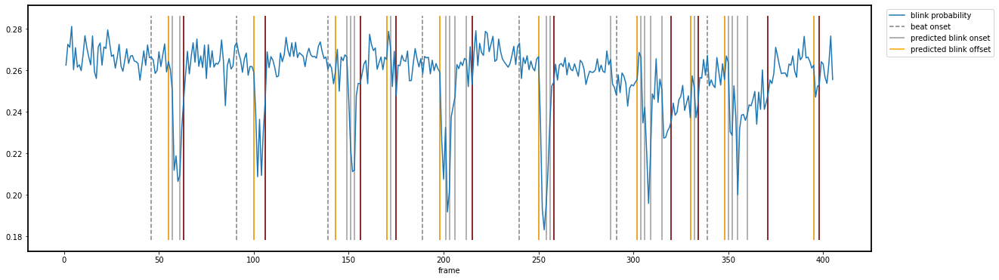

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  13.008000
RecStop - RecStart :  13123.0
Frame Count :  389
FPS :  29.642612207574487
start times :  [1353, 2914, 4454, 6101, 7843, 9559, 10941]
inter-beat duration :  [1561, 1540, 1647, 1742, 1716, 1382] Avg:  1598
blinks :  [(292, 314), (81, 99), (245, 260), (189, 203), (142, 152), (51, 65), (336, 346)]
No. of blinks :  7
Latencies:  [371, nan, 337, 303, 438, 303, 404]
Blink durations :  [742, 607, 506, 472, 337, 472, 337] Avg:  496.14285714285717


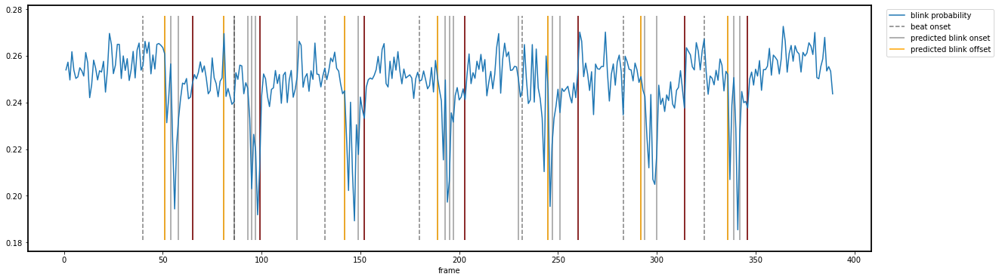

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  13.247000
RecStop - RecStart :  13267.0
Frame Count :  396
FPS :  29.848496268937968
start times :  [1507, 3270, 4878, 6276, 8011, 9430, 11065]
inter-beat duration :  [1763, 1608, 1398, 1735, 1419, 1635] Avg:  1593
blinks :  [(335, 359), (375, 393), (242, 255), (319, 332), (83, 98), (56, 67), (290, 301), (155, 161), (196, 205), (105, 112)]
No. of blinks :  10
Latencies:  [402, 268, 335, 301, 100, 301, 167]
Blink durations :  [804, 603, 435, 435, 502, 368, 368, 201, 301, 234] Avg:  425.1


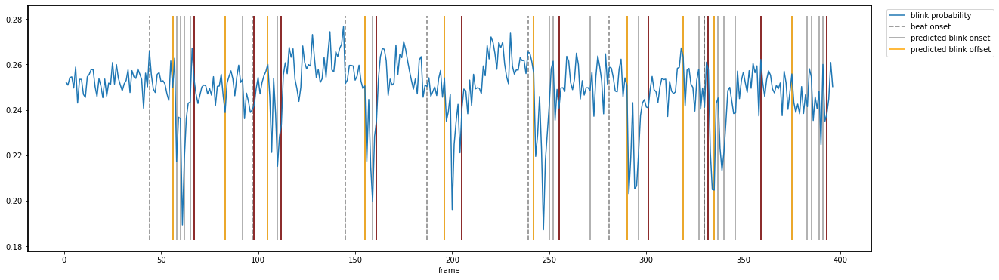

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  13.276000
RecStop - RecStart :  13346.0
Frame Count :  397
FPS :  29.74674059643339
start times :  [1316, 2951, 4701, 6363, 7914, 9537, 11159]
inter-beat duration :  [1635, 1750, 1662, 1551, 1623, 1622] Avg:  1640.5
blinks :  [(32, 56), (96, 115), (172, 193), (246, 264), (342, 350), (131, 153), (384, 397), (290, 300), (71, 90), (316, 320), (201, 205), (279, 281)]
No. of blinks :  12
Latencies:  [1075, 302, 1109, 403, 369, 235, 369]
Blink durations :  [806, 638, 705, 605, 268, 739, 437, 336, 638, 134, 134, 67] Avg:  458.9166666666667


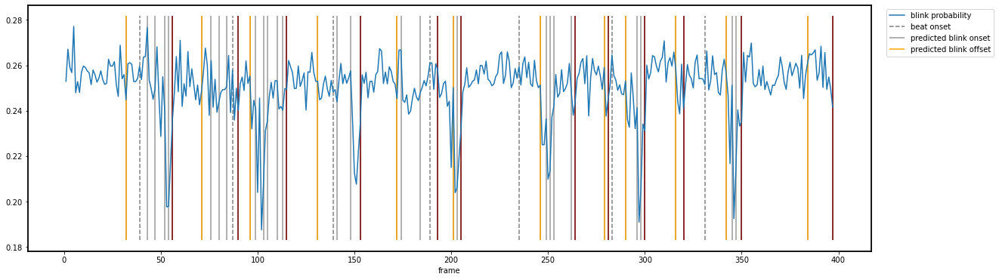

--------------------------------------------------
Recording Name :  blockNr_13_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  12.383000
RecStop - RecStart :  12419.0
Frame Count :  370
FPS :  29.793059022465577
start times :  [1241, 2975, 4415, 5895, 7288, 8855, 10245]
inter-beat duration :  [1734, 1440, 1480, 1393, 1567, 1390] Avg:  1500.6666666666667
blinks :  [(315, 333), (134, 151), (45, 62), (186, 203), (86, 105), (221, 234), (288, 308), (165, 177), (267, 275)]
No. of blinks :  9
Latencies:  [302, nan, 100, 369, 134, 134, 335]
Blink durations :  [604, 570, 570, 570, 637, 436, 671, 402, 268] Avg:  525.3333333333334


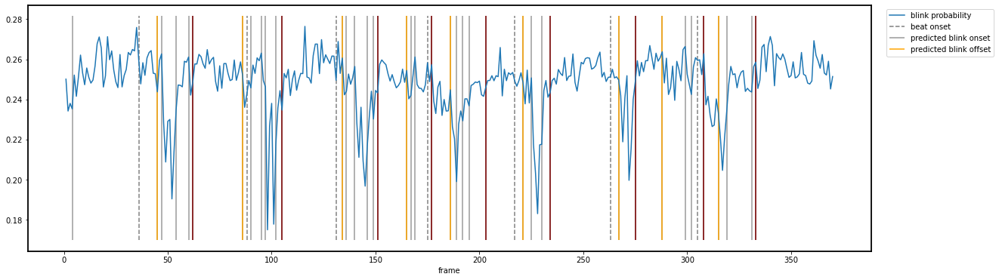

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_1_BlinkRec.webm
Recording length :  13.106000
RecStop - RecStart :  13221.0
Frame Count :  392
FPS :  29.649799561303986
start times :  [1482, 2889, 4616, 6352, 7893, 9312, 11042]
inter-beat duration :  [1407, 1727, 1736, 1541, 1419, 1730] Avg:  1593.3333333333333
blinks :  [(241, 261), (185, 207), (320, 337), (90, 104), (144, 155), (281, 294), (54, 61), (345, 350)]
No. of blinks :  8
Latencies:  [370, 168, 269, nan, 236, 168, 607]
Blink durations :  [674, 741, 573, 472, 370, 438, 236, 168] Avg:  459


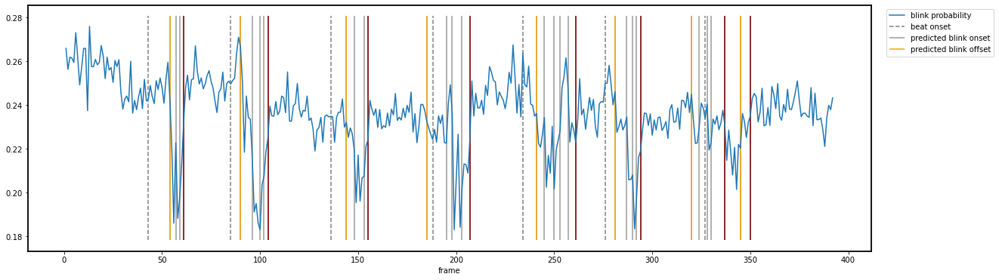

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_2_BlinkRec.webm
Recording length :  12.840000
RecStop - RecStart :  12894.0
Frame Count :  384
FPS :  29.781293624941835
start times :  [1289, 2706, 4208, 5664, 7237, 9001, 10709]
inter-beat duration :  [1417, 1502, 1456, 1573, 1764, 1708] Avg:  1570
blinks :  [(77, 98), (110, 127), (324, 333), (152, 165), (221, 233), (279, 286), (48, 55), (180, 187), (261, 263), (134, 142), (32, 37)]
No. of blinks :  11
Latencies:  [335, 1007, 302, 402, 201, 369, 201]
Blink durations :  [705, 570, 302, 436, 402, 235, 235, 235, 67, 268, 167] Avg:  329.27272727272725


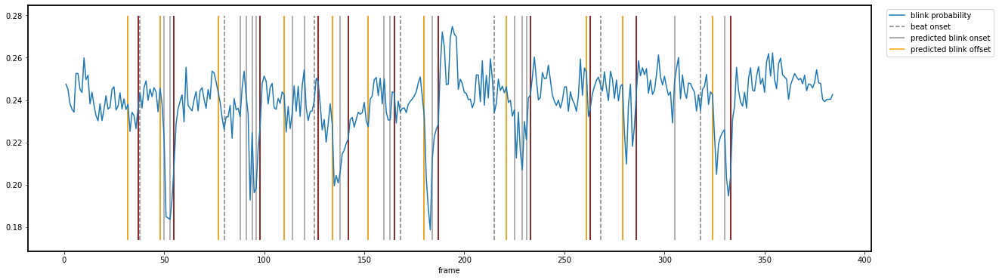

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_3_BlinkRec.webm
Recording length :  12.745000
RecStop - RecStart :  12815.0
Frame Count :  381
FPS :  29.730784237222007
start times :  [1268, 2824, 4275, 5874, 7421, 8936, 10631]
inter-beat duration :  [1556, 1451, 1599, 1547, 1515, 1695] Avg:  1560.5
blinks :  [(230, 248), (129, 144), (86, 100), (282, 289), (205, 219), (49, 58), (327, 333), (185, 191)]
No. of blinks :  8
Latencies:  [403, 100, 67, 369, 336, 571, 369]
Blink durations :  [605, 504, 470, 235, 470, 302, 201, 201] Avg:  373.5


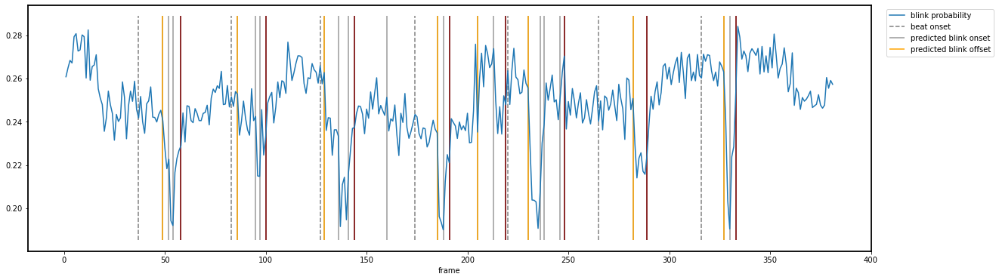

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_4_BlinkRec.webm
Recording length :  12.781000
RecStop - RecStart :  12828.0
Frame Count :  382
FPS :  29.77860929217337
start times :  [1487, 2848, 4561, 6023, 7657, 9180, 10652]
inter-beat duration :  [1361, 1713, 1462, 1634, 1523, 1472] Avg:  1527.5
blinks :  [(90, 111), (176, 198), (12, 32), (278, 290), (54, 68), (143, 152), (321, 337), (239, 245), (362, 365), (41, 46)]
No. of blinks :  10
Latencies:  [335, 201, 268, nan, 369, 167, 134]
Blink durations :  [705, 738, 671, 402, 470, 302, 537, 201, 100, 167] Avg:  429.3


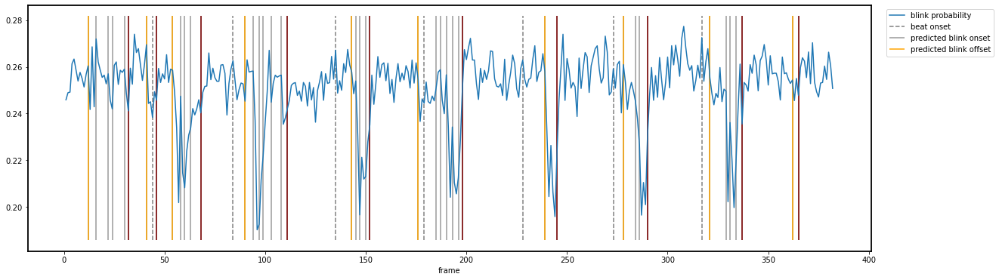

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_15_trialNr_5_BlinkRec.webm
Recording length :  12.675000
RecStop - RecStart :  12709.0
Frame Count :  379
FPS :  29.821386419073097
start times :  [1232, 2666, 4400, 6017, 7517, 9077, 10527]
inter-beat duration :  [1434, 1734, 1617, 1500, 1560, 1450] Avg:  1549.1666666666667
blinks :  [(177, 199), (276, 297), (330, 347), (314, 327), (233, 241), (91, 100), (143, 155), (48, 61)]
No. of blinks :  8
Latencies:  [402, 402, 402, nan, 301, 201, 33]
Blink durations :  [737, 704, 570, 435, 268, 301, 402, 435] Avg:  481.5


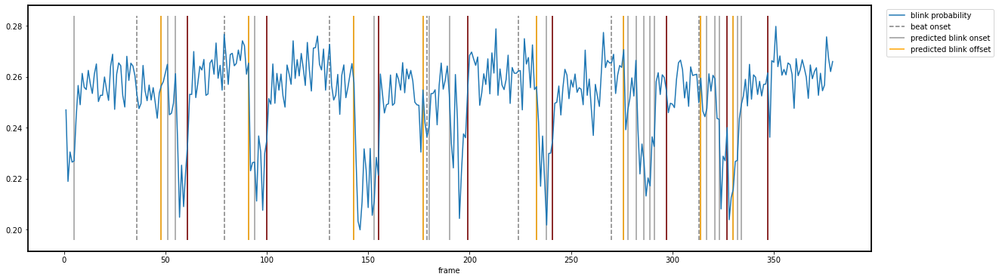

--------------------------------------------------


In [2382]:
#test
model = pred_path.EAR
latencies, blinks, durations = blink_analyse.parse_trials(model)

# Overall Subjects

In [ ]:
blinks_df_ear = subject_wise_blinks(subjects, pred_path.EAR)
blinks_df_rt_bene = subject_wise_blinks(subjects, pred_path.RT_BENE)

 28%|██▊       | 18/65 [01:56<04:12,  5.37s/it]

> 30% missing data
> 30% missing data
> 30% missing data


  3%|▎         | 2/65 [00:12<06:40,  6.35s/it]

> 30% missing data
> 30% missing data
> 30% missing data
> 30% missing data
> 30% missing data


100%|██████████| 65/65 [04:48<00:00,  4.44s/it]100%|██████████| 65/65 [04:48<00:00,  4.55s/it] 98%|█████████▊| 64/65 [04:44<00:04,  4.53s/it] 97%|█████████▋| 63/65 [04:39<00:08,  4.45s/it] 95%|█████████▌| 62/65 [04:33<00:12,  4.04s/it] 94%|█████████▍| 61/65 [04:28<00:14,  3.66s/it] 92%|█████████▏| 60/65 [04:25<00:19,  3.85s/it] 91%|█████████ | 59/65 [04:22<00:24,  4.12s/it] 89%|████████▉ | 58/65 [04:19<00:32,  4.60s/it] 88%|████████▊ | 57/65 [04:14<00:35,  4.43s/it] 86%|████████▌ | 56/65 [04:09<00:38,  4.29s/it] 85%|████████▍ | 55/65 [04:07<00:50,  5.02s/it] 83%|████████▎ | 54/65 [04:01<00:54,  4.91s/it] 82%|████████▏ | 53/65 [03:56<00:57,  4.83s/it] 80%|████████  | 52/65 [03:52<01:03,  4.88s/it] 78%|███████▊  | 51/65 [03:46<01:05,  4.66s/it] 77%|███████▋  | 50/65 [03:41<01:05,  4.40s/it] 75%|███████▌  | 49/65 [03:37<01:16,  4.79s/it] 74%|███████▍  | 48/65 [03:32<01:19,  4.71s/it] 72%|███████▏  | 47/65 [03:28<01:27,  4.88s/it] 71%|███████   | 46/65 [03:23<01:27,  4.63s/it] 69%|██████▉ 

In [2841]:
blinks_df_ear = pd.read_csv("csv_backup/blinks_df_ear.csv", index_col="subb")
blinks_df_rt_bene = pd.read_csv("csv_backup/blinks_df_rt_bene.csv", index_col="subb")

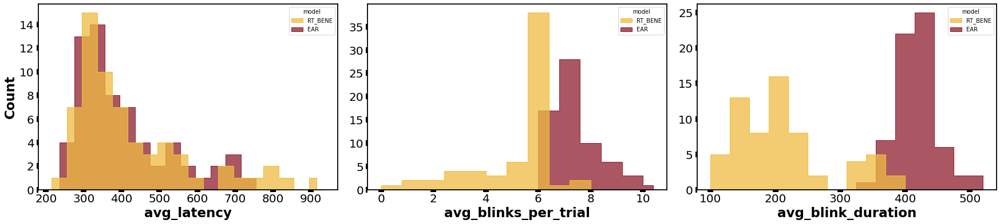

In [3260]:
fig,axs= plt.subplots(1,3, figsize=(30,6))
binw = [40, 0.8, 30]
for i,col in enumerate(blinks_df_ear.columns[-3:]):
    temp = pd.concat([blinks_df_rt_bene[col], blinks_df_ear[col]], axis=0, keys=["RT_BENE","EAR"], names=["model", "subb"]).reset_index()
    sns.histplot(temp, x=col, binwidth=binw[i], element="step", hue="model", multiple="dodge", ax = axs[i], palette=["#F0BC42","#8E1F2F"])
    axs[i].set(xlabel=None, ylabel=None)
#     if i==1:
    axs[i].set_xlabel(col,fontsize=23, fontweight = 550)
    if i==0:
        axs[i].set_ylabel("Count",fontsize=23, fontweight = 550)
    axs[i].tick_params(axis='both', which='major', labelsize=20, width = 10)
    
plt.subplots_adjust(wspace=0.1)
# plt.legend(fontsize=23)
plt.savefig("full_paper_plots/blink_variable_dist.svg",dpi=300, transparent=True)

In [3230]:
# def paired_diff(A,B):
#     try:
#         return [A[k] - B[k] if type(A[k]) == type(B[k]) else np.nan for k in range(1,11) ]
#     except:
#         return np.nan
# temp = blinks_df_ear[["subb","num_of_blinks"]].set_index("subb").join(blinks_df_rt_bene[["subb","num_of_blinks"]].set_index("subb"), rsuffix="R")
# temp["paired_diff"] = temp.apply(lambda x: paired_diff(x["num_of_blinks"], x["num_of_blinksR"]), axis=1)

print("AVG BLINKS")
win_ear = winsorize(blinks_df_ear.avg_blinks_per_trial, limits=[0.1,0.1])
win_rt_bene = winsorize(blinks_df_rt_bene.avg_blinks_per_trial, limits=[0.1,0.1])
print(f"EAR     : {win_ear.mean():20}, IQR : {np.percentile(win_ear, [75,25])}")
print(f"RT_BENE : {win_rt_bene.mean():20}, IQR : {np.percentile(win_rt_bene, [75,25])}" )
# print(f"Diff    : {win_diff.mean():20}, IQR : {np.percentile(win_diff, [75,25])}" )

AVG BLINKS
EAR     :    6.918461538461538, IQR : [7.2 6.3]
RT_BENE :    5.255832703451751, IQR : [6.  4.9]


In [2388]:
from scipy import stats #https://nathancarter.github.io/how2data/site/how-to-compute-a-confidence-interval-for-a-mean-difference-matched-pairs-in-python-using-numpy-and-scipy/
alpha = 0.5
temp = blinks_df_ear[["subb","avg_blinks_per_trial"]].set_index("subb").join(blinks_df_rt_bene[["subb","avg_blinks_per_trial"]].set_index("subb"), rsuffix="R")
temp["diff_"] = temp.apply(lambda x: x["avg_blinks_per_trial"] - x["avg_blinks_per_trialR"], axis=1)
diff_mean = temp["diff_"].mean()
print("Paired diff : ", diff_mean)
critical_val = stats.t.ppf(q = 1-alpha/2, df = temp.shape[0] - 1)
radius = critical_val*np.sqrt(temp["diff_"].var())/np.sqrt(temp.shape[0])
print("CI          : ", diff_mean - radius, diff_mean + radius )    

Paired diff :  1.8082892416225749
CI          :  1.6439437576503961 1.9726347255947536


In [3231]:
print("BLINK DURATION")
win_ear = winsorize(blinks_df_ear.avg_blink_duration, limits=[0.1,0.1])
win_rt_bene = winsorize(blinks_df_rt_bene.avg_blink_duration, limits=[0.1,0.1])
print(f"EAR     : {win_ear.mean():20}, IQR : {np.percentile(win_ear, [75,25])}")
print(f"RT_BENE : {win_rt_bene.mean():20}, IQR : {np.percentile(win_rt_bene, [75,25])}" )
# print(f"Diff    : {

BLINK DURATION
EAR     :      403.51922574702, IQR : [423.78823529 382.75789474]
RT_BENE :   211.56730999077982, IQR : [242.66558812 157.33232759]


In [2393]:
from scipy import stats
alpha = 0.5
temp = blinks_df_ear[["subb","avg_blink_duration"]].set_index("subb").join(blinks_df_rt_bene[["subb","avg_blink_duration"]].set_index("subb"), rsuffix="R")
temp["diff_"] = temp.apply(lambda x: x["avg_blink_duration"] - x["avg_blink_durationR"], axis=1)
diff_mean = temp["diff_"].mean()
print("Paired diff : ", diff_mean)
critical_val = stats.t.ppf(q = 1-alpha/2, df = temp.shape[0] - 1)
radius = critical_val*np.sqrt(temp["diff_"].var())/np.sqrt(temp.shape[0])
print("CI          : ", diff_mean - radius, diff_mean + radius )    

Paired diff :  192.50251111630217
CI          :  186.7507877956403 198.25423443696405


Recording Name :  blockNr_6_taskNr_3_trialNr_3_BlinkRec.webm
Recording length :  12.632000
RecStop - RecStart :  12706.0
Frame Count :  376
FPS :  29.592318589642687
start times :  [1445, 3053, 4606, 6032, 7528, 8912, 10541]
inter-beat duration :  [1608, 1553, 1426, 1496, 1384, 1629] Avg:  1516
blinks :  [(230, 248), (321, 336), (271, 286), (186, 196), (97, 105), (50, 59), (144, 152), (32, 38)]
No. of blinks :  8
Latencies:  [270, 236, 270, 270, 270, 270, 337]
Blink durations :  [608, 506, 506, 337, 270, 304, 270, 202] Avg:  375.375


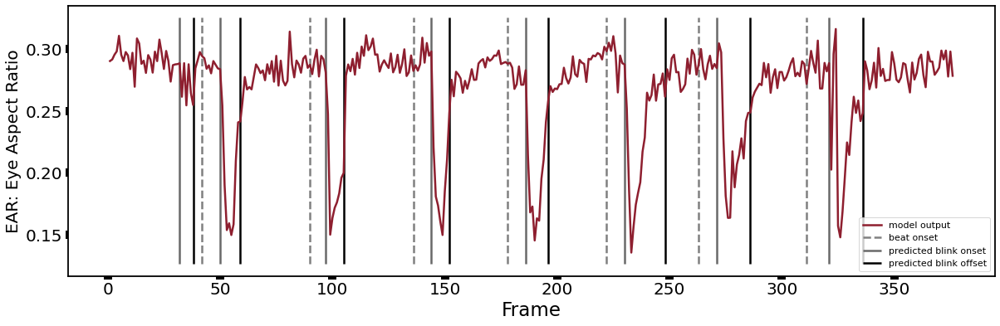

--------------------------------------------------
Recording Name :  blockNr_6_taskNr_3_trialNr_3_BlinkRec.webm
Recording length :  12.632000
RecStop - RecStart :  12706.0
Frame Count :  376
FPS :  29.592318589642687
start times :  [1445, 3053, 4606, 6032, 7528, 8912, 10541]
inter-beat duration :  [1608, 1553, 1426, 1496, 1384, 1629] Avg:  1516
blinks :  [(273, 281), (143, 151), (231, 238), (51, 58), (322, 329), (98, 105), (187, 194)]
No. of blinks :  7
Latencies:  [304, 270, 236, 304, 304, 337, 371]
Blink durations :  [270, 270, 236, 236, 236, 236, 236] Avg:  245.71428571428572


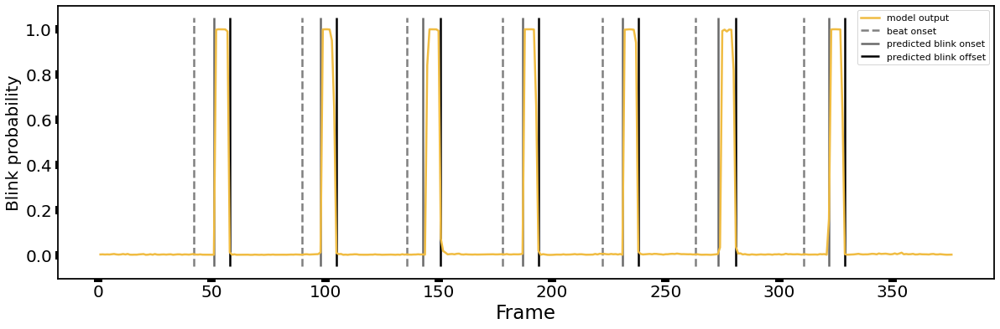

--------------------------------------------------


In [3228]:
np.random.seed(2)
blink_analyse = Blink_Detect(np.random.choice(subjects), show=False)
_,_,_ = blink_analyse.parse_trials(pred_path.EAR, trial=7)
_,_,_ = blink_analyse.parse_trials(pred_path.RT_BENE, trial=7)
# plt.savefig("full_paper_plots/blinks_single_trial.png")

In [3229]:
print("BLINK LATENCY")
win_ear = winsorize(blinks_df_ear.avg_latency, limits=[0.1,0.1])
win_rt_bene = winsorize(blinks_df_rt_bene.avg_latency, limits=[0.1,0.1])
print(f"EAR     : {win_ear.mean():20}, IQR : {np.percentile(win_ear, [75,25])}")
print(f"RT_BENE : {win_rt_bene.mean():20}, IQR : {np.percentile(win_rt_bene, [75,25])}" )

BLINK LATENCY
EAR     :   380.68233161201755, IQR : [427.14285714 292.79411765]
RT_BENE :    418.8138662368524, IQR : [502.88091216 318.3331202 ]


In [2400]:
from scipy import stats
alpha = 0.5
temp = blinks_df_ear[["subb","avg_latency"]].set_index("subb").join(blinks_df_rt_bene[["subb","avg_latency"]].set_index("subb"), rsuffix="R")
temp["diff_"] = temp.apply(lambda x: x["avg_latency"] - x["avg_latencyR"], axis=1)
diff_mean = temp["diff_"].mean()
print("Paired diff : ", diff_mean)
critical_val = stats.t.ppf(q = 1-alpha/2, df = temp.shape[0] - 1)
radius = critical_val*np.sqrt(temp["diff_"].var())/np.sqrt(temp.shape[0])
print("CI          : ", diff_mean - radius, diff_mean + radius )    

Paired diff :  -42.77203926665541
CI          :  -50.116502363927786 -35.42757616938304


AttributeError: 'Blink_Detect' object has no attribute 'parse_trials_stack'

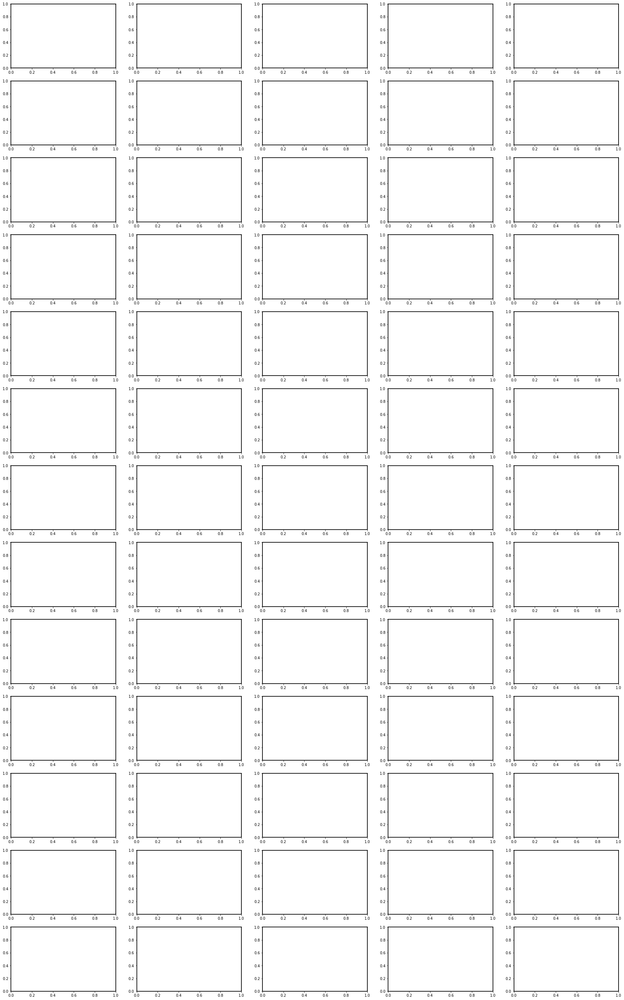

In [1817]:
fig,axs = plt.subplots(13,5, figsize=(30,50))
temp = []
for i,subb in enumerate(subjects):
    blink_analyse = Blink_Detect(subb, show=False)
    trial_latency = blink_analyse.parse_trials_stack(model=pred_path.EAR, show = False)
#     lengths = [len(t[~np.isnan(t)]) for t in trial_latency.values()]
    t = np.concatenate(list(trial_latency.values()))/0.030
    t = t[~np.isnan(t)]
    temp.append(t)
    if t.shape[0] == 0: continue
    sns.histplot(t, binwidth=50, ax= axs[int(i/5)][int(i%5)])
#     axs[int(i/5)][int(i%5)].set_xlim(0,1600)
#     axs[int(i/5)][int(i%5)].set_ylim(0,25)
#     try:
#         avg_bpt = winsorize(lengths, limits=[0.1,0.1]).mean()
#         avg_lat = winsorize(t[~np.isnan(t)], limits=[0.1,0.1]).mean()/0.030
#     except:
#         avg_bpt = np.nan
#         avg_lat = np.nan
# plt.savefig("full_paper_plots/ear_blinks_subjectwise.png")

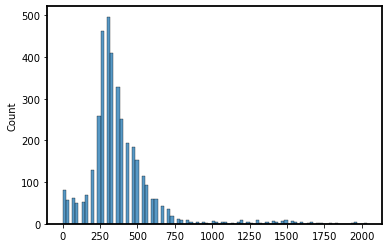

In [960]:
sns.histplot([i for j in temp for i in j])
plt.savefig("full_paper_plots/ear_hist.png")

<AxesSubplot:xlabel='avg_latency', ylabel='Count'>

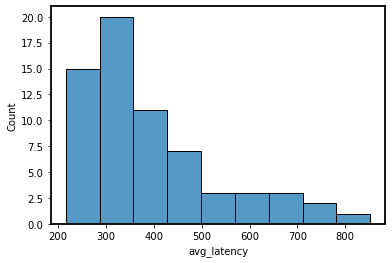

In [2401]:
sns.histplot(blink_df_ear["avg_latency"])

In [ ]:
blinks_df_ear.trial_latencies.apply(pd.Series).apply(lambda x: [i[beat] if len(i)==7 else np.nan for i in x]).to_numpy().flatten()
# rt_bene = blinks_df_rt_bene.trial_latencies.apply(pd.Series).apply(lambda x: [i[beat] if len(i)==7 else np.nan for i in x]).to_numpy().flatten()


array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan])

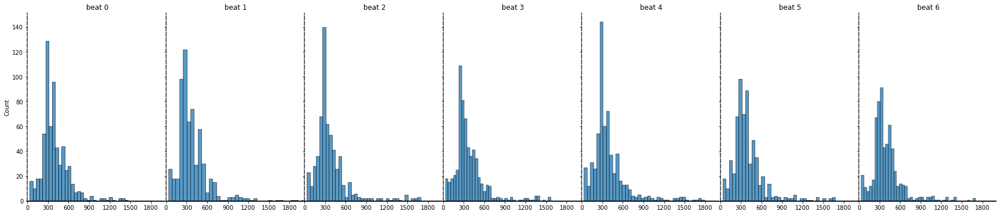

<Figure size 432x288 with 0 Axes>

In [2803]:
fig,axs = plt.subplots(1,7, figsize=(30,6), sharey=True)

for beat in range(7):
    sns.histplot(temp, x=col, binwidth=binw[i], element="step", hue="model", multiple="dodge", ax = axs[i], palette=["#F0BC42","#8E1F2F"])
    
    ear = blinks_df_ear.trial_latencies.apply(pd.Series).apply(lambda x: [i[beat] if len(i)==7 else np.nan for i in x]).to_numpy().flatten()
    rt_bene = blinks_df_rt_bene.trial_latencies.apply(pd.Series).apply(lambda x: [i[beat] if len(i)==7 else np.nan for i in x]).to_numpy().flatten()
    temp = pd.concat([rt_bene, ear], axis=0, keys=["RT_BENE","EAR"], names=["model", "subb"]).reset_index()
    sns.histplot(temp, x= ax = axs[beat])
    sns.despine()
    axs[beat].set_xlim(0,2000)
    axs[beat].spines["left"].set_linestyle("--")
    axs[beat].spines["left"].set_alpha(0.7)
    axs[beat].set_xticks([0,300, 600 , 900,1200, 1500, 1800])
    axs[beat].set_title(f" beat {beat}")

plt.subplots_adjust(wspace=0.01)
plt.show()
plt.savefig("full_paper_plots/Blink_beatwise_dist.png", dpi=300)

<AxesSubplot:ylabel='Count'>

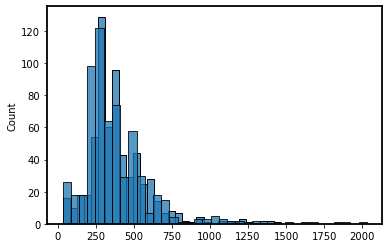

In [2542]:
# for beat in range(7):
temp = blinks_df_ear.trial_latencies.apply(pd.Series).apply(lambda x: [i[0] if len(i)==7 else np.nan for i in x]).to_numpy().flatten()
sns.histplot(temp)

temp = blinks_df_ear.trial_latencies.apply(pd.Series).apply(lambda x: [i[1] if len(i)==7 else np.nan for i in x]).to_numpy().flatten()
sns.histplot(temp, x=)

### Simultaneous vs instantaneous blinks

In [226]:
pth = "/".join(pred_path.EAR.value.split("/")[:-2])
import sys
sys.path.append(pth)
from quick_blinks import get_ear
df = get_ear(f"{pth}/test.webm")

730it [00:35, 20.57it/s]


In [238]:
df2.shape

(389, 2)

<AxesSubplot:>

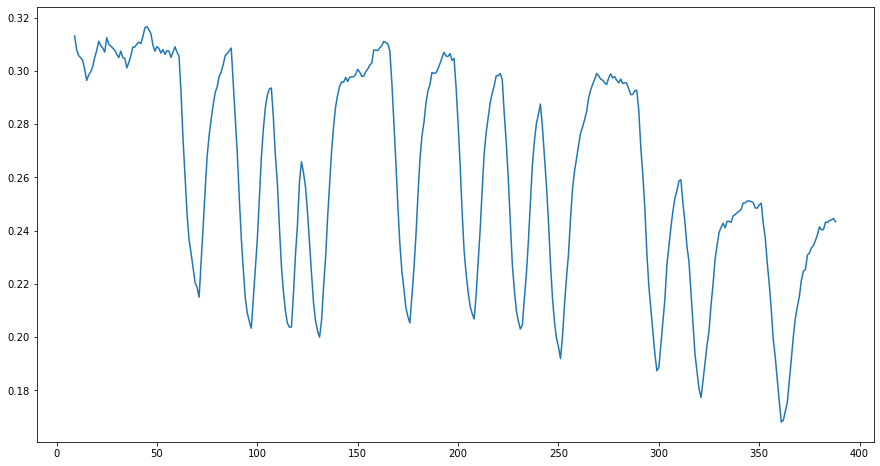

In [239]:
temp = df.ear[:df2.shape[0]].rolling(10).mean()
temp.plot()

<AxesSubplot:>

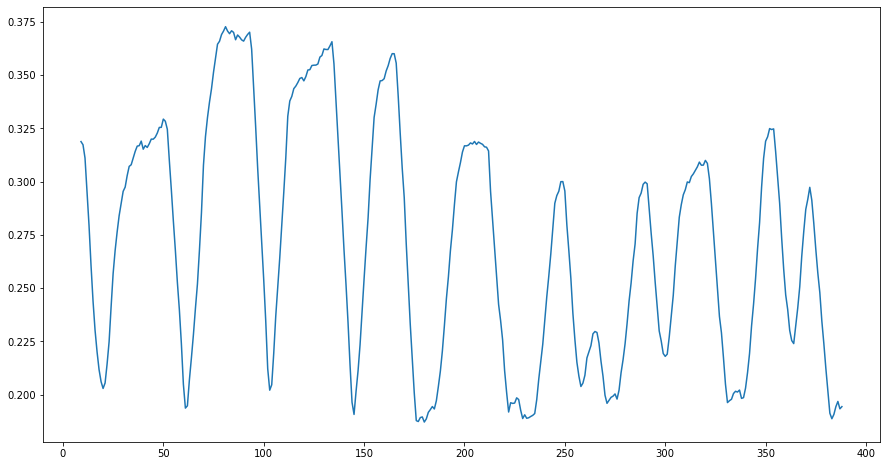

In [241]:
# df2 = get_ear(f"{pth}/test_blinks.webm")
df2.ear[:df2.shape[0]].rolling(10).mean().plot(figsize=(15,8))

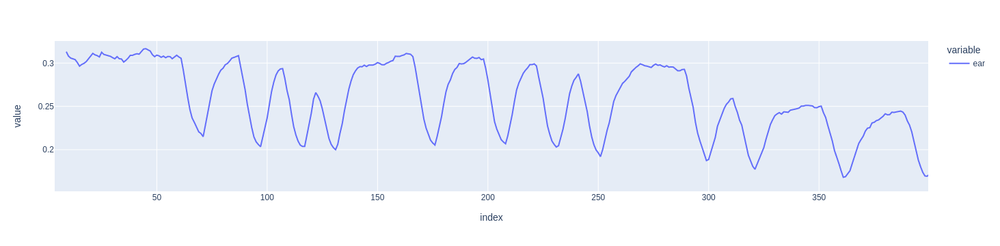

In [247]:
pd.options.plotting.backend = "plotly"
df.ear.rolling(10).mean().plot()

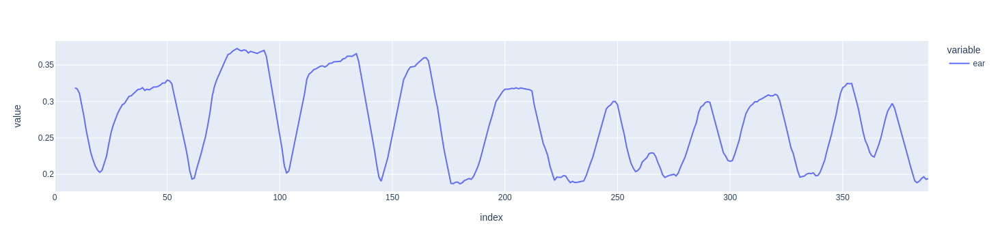

In [248]:
df2.ear[:df2.shape[0]].rolling(10).mean().plot()